# Clustering of all data

Read in all necessary packages:

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.io.parsers import read_csv
import scvelo as scv
import scanpy as sc
import numpy as np
from functools import reduce
from anndata import AnnData, read_h5ad
import singlecellmultiomics.bamProcessing.bamToRNACounts
import loompy
import scanpy.external as sce

In [2]:
scv.settings.verbosity = 3 # show errors(0), warnings(1), info(2), hints(3)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scv.settings.presenter_view = True  # set max width size for presenter view
#scv.set_figure_params('scvelo')  # for beautified visualization
sc.set_figure_params(dpi=100, color_map = 'viridis')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.6.0 pandas==1.2.0 scikit-learn==0.24.0 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


# Load the dataset

In [3]:
pathToData = '/Users/m.blotenburg/Documents/Projects/TCHIC/data/rep1/'

In [4]:
adata_file = pathToData + '/dataframes/20210223_TCHIC_rep1_Scanpy.h5ad' 

In [5]:
adata = sc.read(adata_file)
adata.obs['celltype'] = [sub.replace('Neural_tube_2', 'NeuralTube2') for sub in adata.obs['celltype']]

In [6]:
adata

AnnData object with n_obs × n_vars = 8393 × 29196
    obs: 'n_counts', 'n_genes', 'percent_mito', 'batch', 'day', 'replicates', 'mark', 'umap_density_mark', 'leiden', 'louvain', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'celltype_colors', 'day_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'mark_colors', 'neighbors', 'pca', 'rank_genes_groups', 'replicates_colors', 'umap', 'umap_density_mark_params'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

# Scanpy

### Known marker genes

Overview of louvain clusters, cell type annotation, known marker genes and marker genes as defined by Scanpy.
(120hAA)

Louvain Group | Cell type | Known marker genes | Scanpy marker genes
---|---|---|---
1 | Neurons | Sox1, Sox2 | Sox1, Sox2, Sox13, Ncam1, Crabp2, Nkx1-2, Gbx2, Hoxc8, Hoxb9, Hoxc9
2 | Anterior neural / Neurectoderm | Foxg1 | Sox1, Sox21, Tmsb4x, Epha4
3 | Branchial arches | Onecut2, Elavl3, Tmsb4x, Celsr3, Btbd17 | Onecut2, Elavl3, Tmsb4x, Hes6
4 | Early endoderm | Prdm1, Irx1 | Peg3, Prrx1, Prrx2, Pbx1, Meis2 | -
5 | Endoderm | Foxa2, Cdh1, Sox17, Trh, 
6 | Early heart progenitors | Bmp4, Gata4, Gata6, Hand1, Hand2 | Bmp4, Runx1t1, Gata6, Msx1, Nrp1, Peg10
7 | Allantois (?) | Tbx4 | Mdm2, Klf9, Stx3, Cdkn1a, Ccng1
8 | Presomitic mesoderm | Dll1, Hes7, Snai1, Hes5, Dkk1, Lfng | Dll1, Hes7, Rspo3, Dll3, Tbx6
9 | Early somitic | Eya1, Pax3, Six1, Cer1 | Eya1, Pax3, Meox1, Cadm1, Nav1
10 | Somitogenesis wavefront | Aldh1a2, Notch1, Lfng | Aldh1a2, Notch1, Foxc1, Foxc2, Foxp1, Lef1
11 | Tailbud | T, Wnt3a, Cdx2, Fgf8 | T, Foxb1, Fgf17, Rspo3, Hoxc6, Hoxc8, Hes7
12a | PGCs | Sox2, Nanog | Nanog, Mt1, Mt2
12b | Node | Cdh1, Trh, Nodal, Sox17, Epcam | Cdh1, Trh
13 | Haemogenic | Sox7 | Car2, Kdr

Check if everything still looks the same 

... storing 'celltype' as categorical


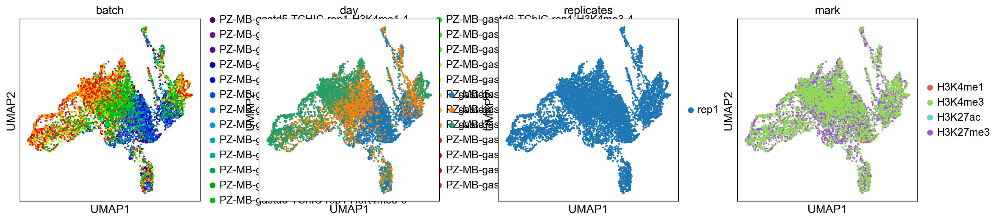

In [7]:
sc.pl.umap(adata, color=['batch','day', 'replicates', 'mark'],size=20)

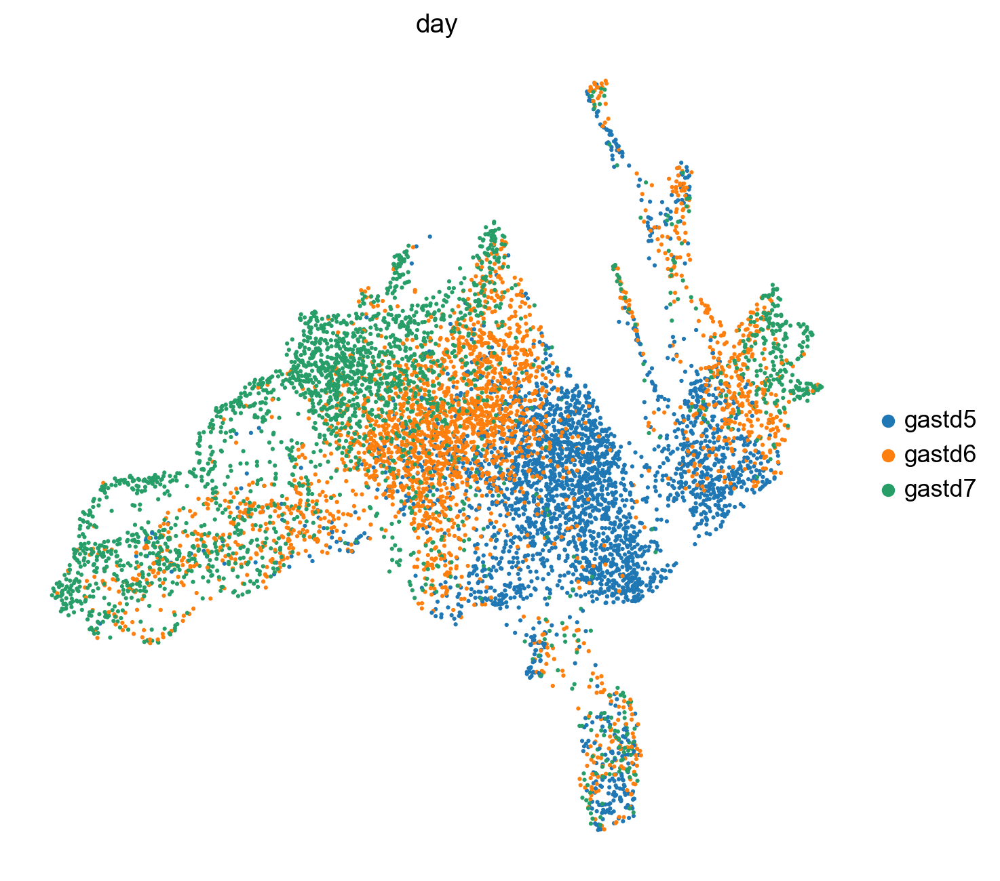

In [8]:
fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata, ax=ax, frameon = False, color='day',size=20)

computing density on 'umap'
--> added
    'umap_density_mark', densities (adata.obs)
    'umap_density_mark_params', parameter (adata.uns)


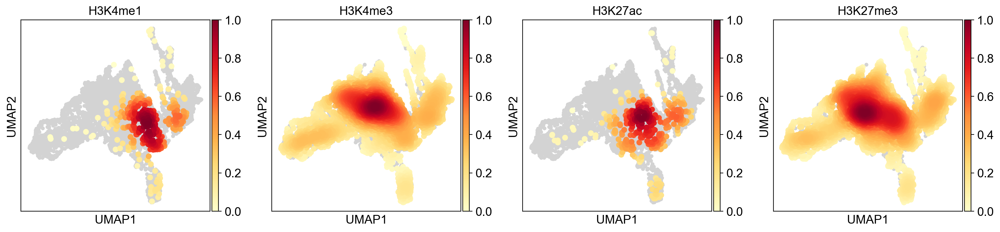

In [9]:
sc.tl.embedding_density(adata, groupby='mark')
sc.pl.embedding_density(adata, groupby='mark')

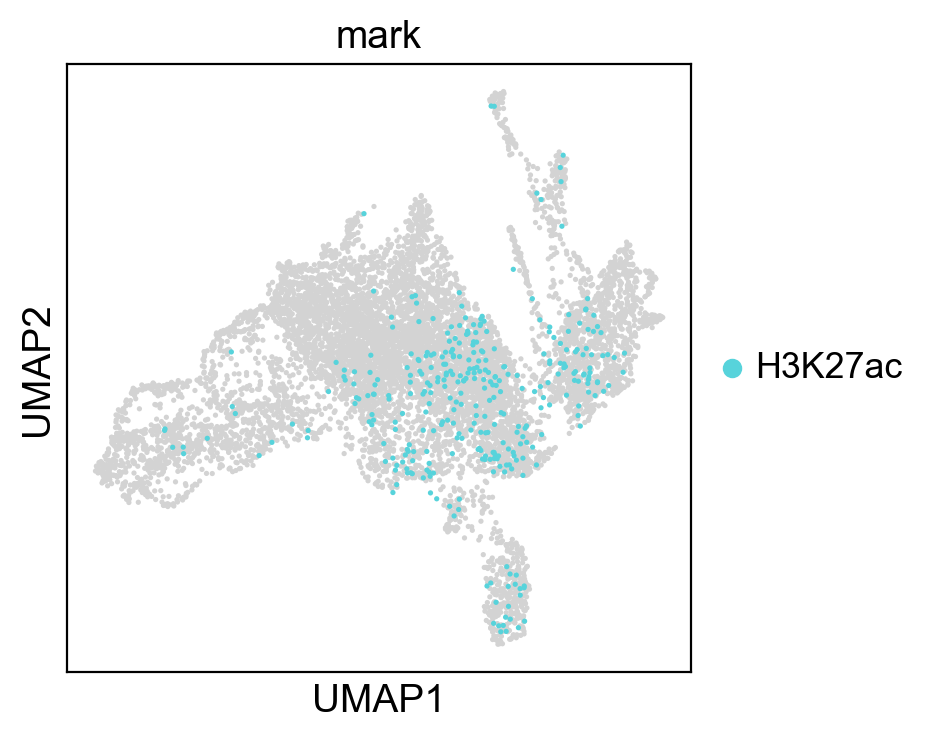

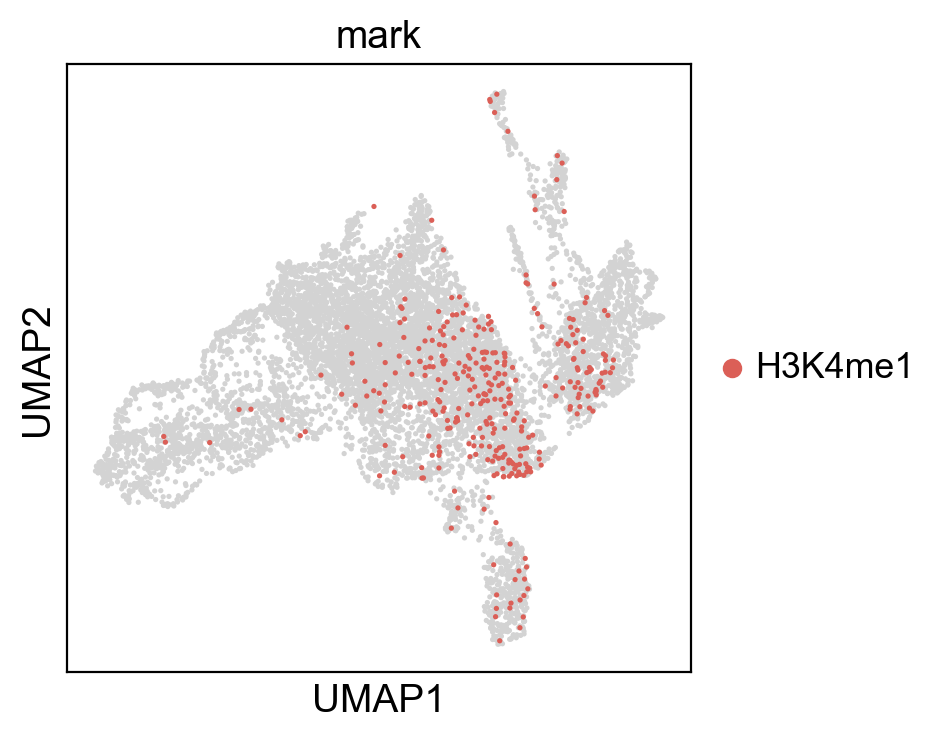

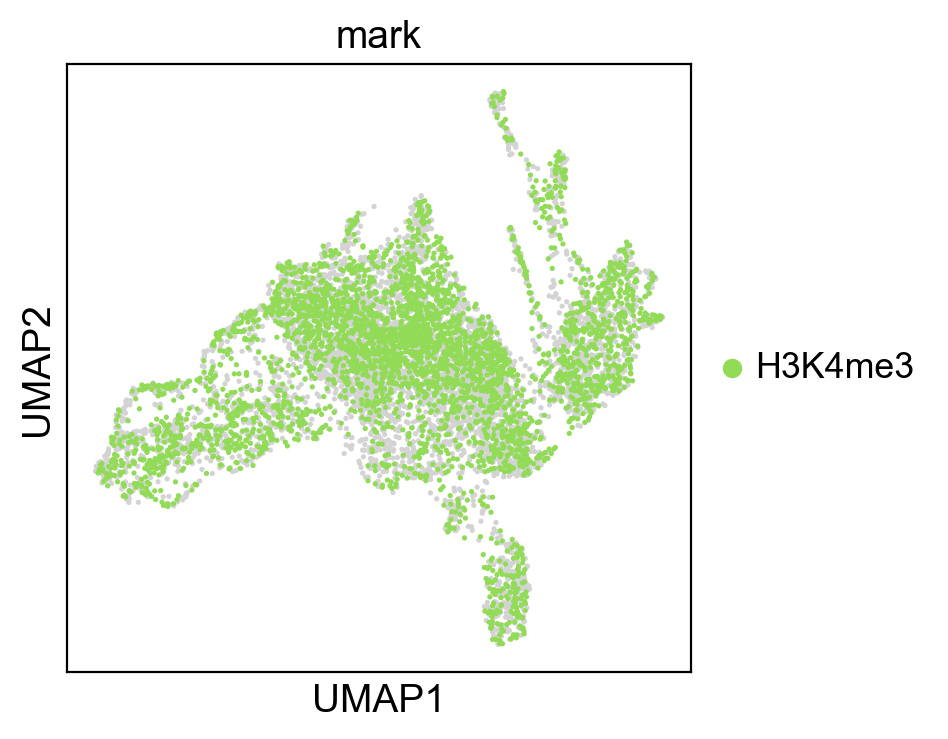

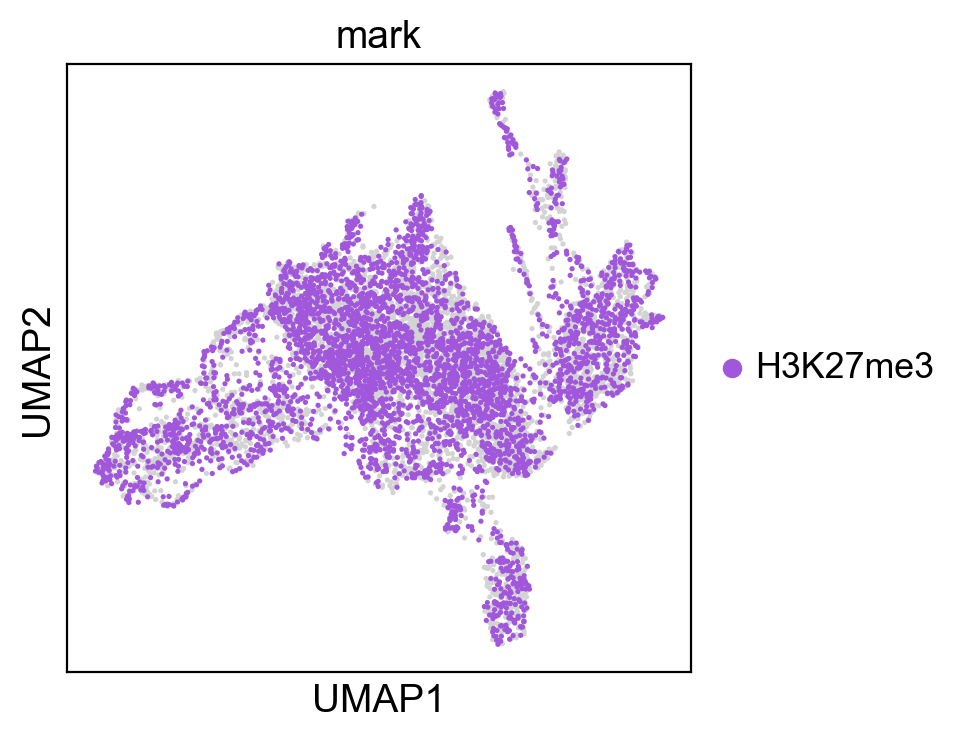

In [10]:
for batch in adata.obs['mark'].unique():
    sc.pl.umap(adata, color='mark', groups=[batch])

## Various ways of displaying interesting (marker) genes

In [11]:
# if your color map is being annoying, rerun this:
sc.set_figure_params(dpi=100, color_map = 'viridis')

First, define lists of interesting genes and marker genes.

In [12]:
polycomb = ['Jarid2', "Eed","Ezh2", "Prc1", "Ring1", "Suz12", "Phc1","Phc2", "Suv39h2"] #Prc2
k4 = ['Setd5', 'Setd1a', 'Setd3', 'Setdb2', 'Setd7', 'Setd1b','Jarid2']

markergenes = ['Esrrb', 'Dppa2', 'Dppa4', 'Nanog', 'Dppa5a','Gsc', 'Klf9', 'Klf2', 'Utf1', 'Pim2', 
               'Dppa3', 'Dnmt3b', 'Dazl', #PGC
               'Cdh1', 'Trh', 'Sox17', 'Nodal', 'Epcam', 'Foxa2', 'Lefty1', #endoderm/PGC/node
               'Sox7','Kdr','Car2', #haemogenic
               'Bmp4', 'Gata4', 'Gata6', 'Hand1', 'Hand2', #heart
               'Dll1', 'Hes7', 'Uncx', 'Snai1', 'Hes5', 'Dkk1', #presomitic
               'Eya1', 'Pax3', 'Six1', 'Cer1', #early somite
               'Aldh1a2', 'Notch1', 'Lfng', #wavefront
               'Onecut2', 'Elavl3', 'Crabp1', #neural tube/branchial arches
               'Wnt3a', 'Fgf8', 'T', 'Cdx2', #posterior
               'Sox21', 'Nkx1-2', #neural SOX2 SOX1
               'Prdm1', 'Irx1', 'Eomes', 'Meox1','Tbx4', 'Sox3','H19', 'Xist','Gata2', 'Gata3','Gata4' #other   
              ]

hox = adata.var.filter(regex=r'Hox', axis=0).index

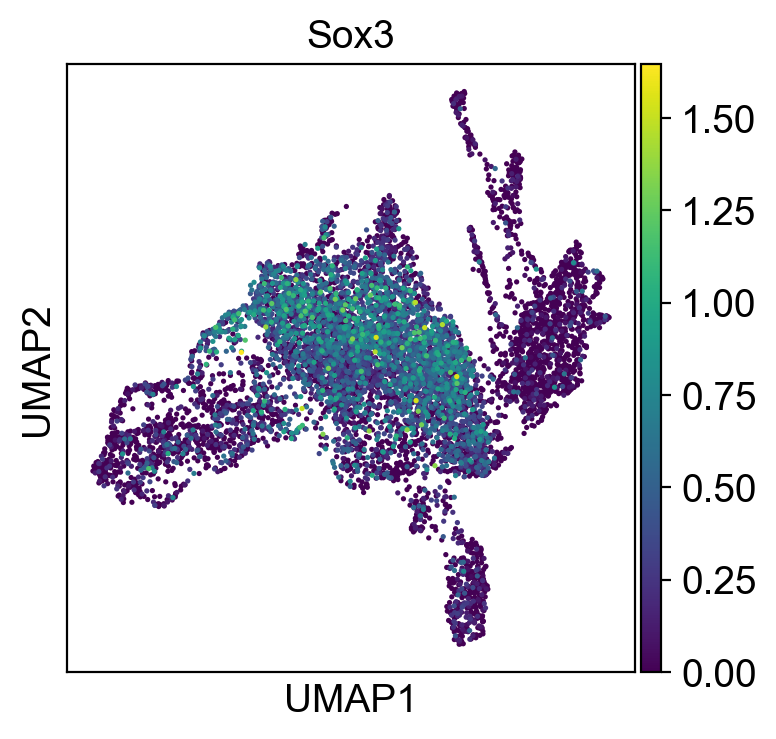

In [13]:
sc.pl.umap(adata, color='Sox3', use_raw=True, color_map = 'viridis')

In [14]:
#sc.pl.umap(adata, color=markergenes, use_raw=True, color_map = 'viridis')

In [15]:
#sc.pl.umap(adata, color=hox, use_raw=True, color_map = 'viridis')

In [16]:
#sc.pl.umap(adata, color=k4, use_raw=True, color_map = 'viridis')

In [17]:
#sc.pl.umap(adata, color=polycomb, use_raw=True, color_map = 'viridis')

You can also make a heatmap. ! this takes a bit of time to compute.

In [18]:
#sc.pl.heatmap(adata, var_names = adata.var_names[adata.var['highly_variable'] & (np.log(adata.var['means'])>-1)])

If you want to compare a certain gene across groups, use the following.

In [19]:
#sc.pl.violin(adata, markergenes, groupby='leiden', size = 1)

Now that we annotated the cell types, let us visualize the marker genes.

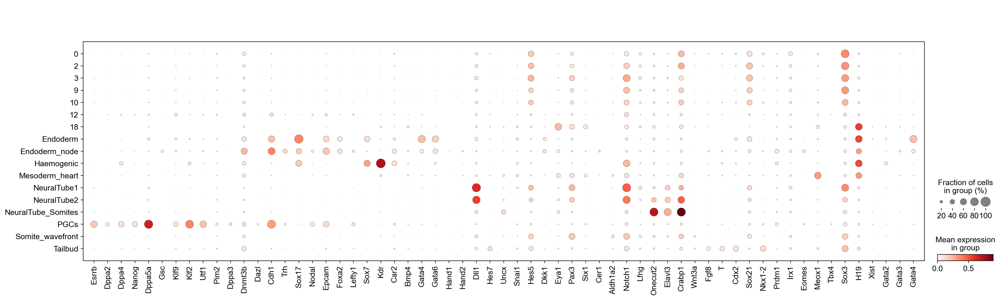

In [20]:
ax = sc.pl.dotplot(adata, markergenes, groupby='celltype', title = '') # ,save='dotplot_markergenes.png')

There is also a very compact violin plot.

In [21]:
#ax = sc.pl.stacked_violin(adata, markergenes, groupby='celltype', rotation=90)

## subset the data. 
Here we choose the neuronal lineage

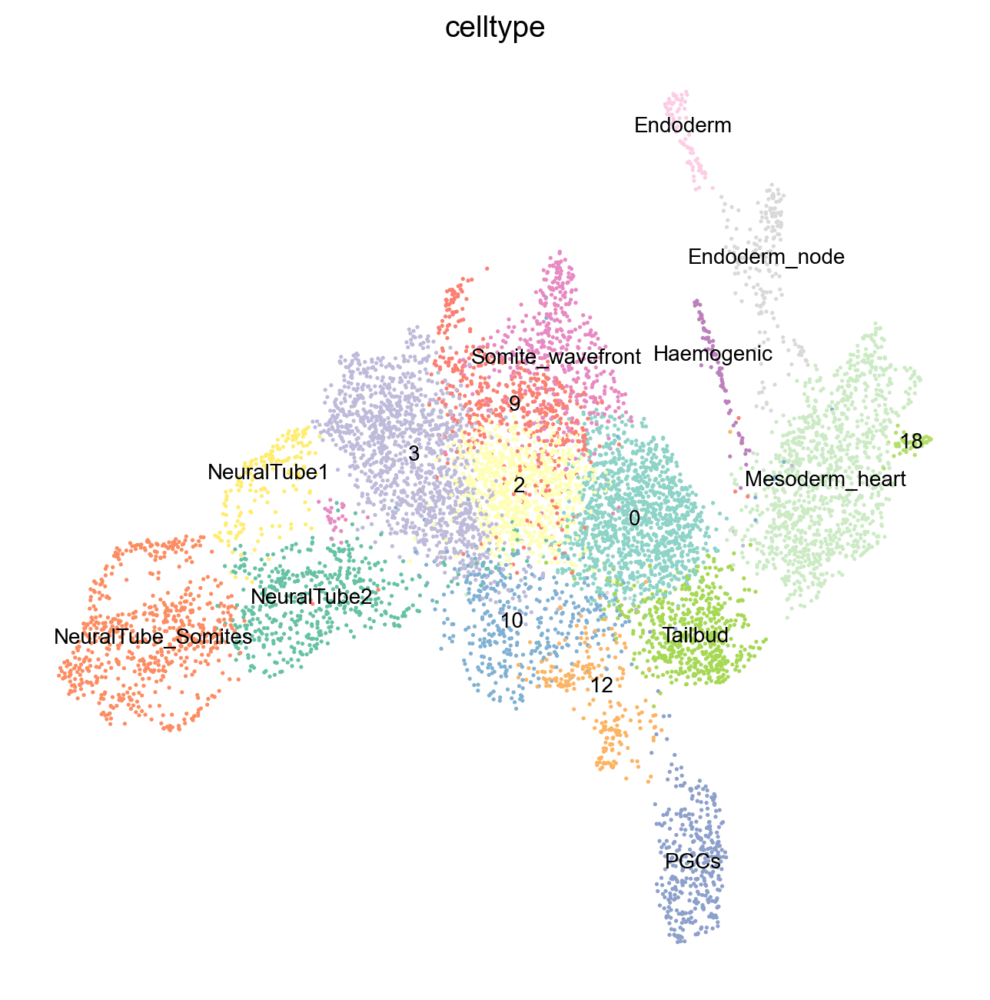

In [22]:
fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata, color = 'celltype', ax=ax, legend_loc = "on data", legend_fontsize=10, frameon=False,legend_fontweight='light')

In [30]:
adata_main = adata[adata.obs['celltype'] == 'Tailbud'].concatenate(adata[adata.obs['celltype'] == '12'], 
                                                                    adata[adata.obs['celltype'] == '10'], 
                                                                    adata[adata.obs['celltype'] == '0'], 
                                                                    adata[adata.obs['celltype'] == '2'], 
                                                                    adata[adata.obs['celltype'] == '3'],
                                                                    adata[adata.obs['celltype'] == '9'],
                                                                    adata[adata.obs['celltype'] == 'Somite_wavefront'],
                                                                    adata[adata.obs['celltype'] == 'Mesoderm_heart'],
                                                                    adata[adata.obs['celltype'] == 'NeuralTube1'], 
                                                                    adata[adata.obs['celltype'] == 'NeuralTube_Somites'], 
                                                                    adata[adata.obs['celltype'] == 'NeuralTube2'],
                                                     join='outer')

adata_endo = adata[adata.obs['celltype'] == 'Endoderm'].concatenate(adata[adata.obs['celltype'] == 'Endoderm_node'], 
                                                                    adata[adata.obs['celltype'] == 'Mesoderm_heart'],  
                                                                    #adata[adata.obs['celltype'] == 'Tailbud'], 
                                                     join='outer')

adata_meso = adata[adata.obs['celltype'] == '12'].concatenate(adata[adata.obs['celltype'] == 'Tailbud'], 
                                                                    adata[adata.obs['celltype'] == '10'], 
                                                                    adata[adata.obs['celltype'] == '9'], 
                                                                    adata[adata.obs['celltype'] == 'Mesoderm_heart'], 
                                                                    adata[adata.obs['celltype'] == 'Somite_wavefront'],
                                                     join='outer')

adata_neuron = adata[adata.obs['celltype'] == '0'].concatenate(adata[adata.obs['celltype'] == '2'], adata[adata.obs['celltype'] == '3'], 
                                                     adata[adata.obs['celltype'] == 'NeuralTube1'], adata[adata.obs['celltype'] == 'NeuralTube_Somites'], 
                                                               adata[adata.obs['celltype'] == 'NeuralTube2'],
                                                     join='outer')

adata_haemo = adata[adata.obs['celltype'] == 'Haemogenic']

adata_pgc = adata[adata.obs['celltype'] == 'PGCs']

In [31]:
adata_meso2 = adata_meso[adata_meso.obs['louvain'] == '0'].concatenate(adata_meso[adata_meso.obs['louvain'] == '1'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '2'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '3'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '5'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '6'],
                                                                    adata_meso[adata_meso.obs['louvain'] == '7'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '8'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '9'], 
                                                                    adata_meso[adata_meso.obs['louvain'] == '10'],
                                                                    adata_meso[adata_meso.obs['louvain'] == '11'],                                                                      
                                                     join='outer')



In [32]:
print('Main')
print(adata_main.obs['celltype'].unique())
print('Endoderm')
print(adata_endo.obs['celltype'].unique())
print('Mesoderm')
print(adata_meso.obs['celltype'].unique())
print('Mesoderm2')
print(adata_meso2.obs['celltype'].unique())
print('Neurons')
print(adata_neuron.obs['celltype'].unique())
print('Haemogenic')
print(adata_haemo.obs['celltype'].unique())
print('PGCs')
print(adata_pgc.obs['celltype'].unique())

Main
['Tailbud' '12' '10' '0' '2' '3' '9' 'Somite_wavefront' 'Mesoderm_heart'
 'NeuralTube1' 'NeuralTube_Somites' 'NeuralTube2']
Endoderm
['Endoderm' 'Endoderm_node' 'Mesoderm_heart']
Mesoderm
['12' 'Tailbud' '10' '9' 'Mesoderm_heart' 'Somite_wavefront']
Mesoderm2
['Tailbud' '10' '9' 'Mesoderm_heart' 'Somite_wavefront' '12']
Neurons
['0' '2' '3' 'NeuralTube1' 'NeuralTube_Somites' 'NeuralTube2']
Haemogenic
['Haemogenic']
Categories (1, object): ['Haemogenic']
PGCs
['PGCs']
Categories (1, object): ['PGCs']


Choose which subset to run through the analysis

In [33]:
adata_sub = adata_endo
adata_sub

AnnData object with n_obs × n_vars = 1309 × 29196
    obs: 'n_counts', 'n_genes', 'percent_mito', 'batch', 'day', 'replicates', 'mark', 'umap_density_mark', 'leiden', 'louvain', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'mean', 'std', 'dispersions-0', 'dispersions_norm-0', 'dispersions-1', 'dispersions_norm-1', 'dispersions-2', 'dispersions_norm-2'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

... storing 'leiden' as categorical
... storing 'louvain' as categorical
... storing 'celltype' as categorical


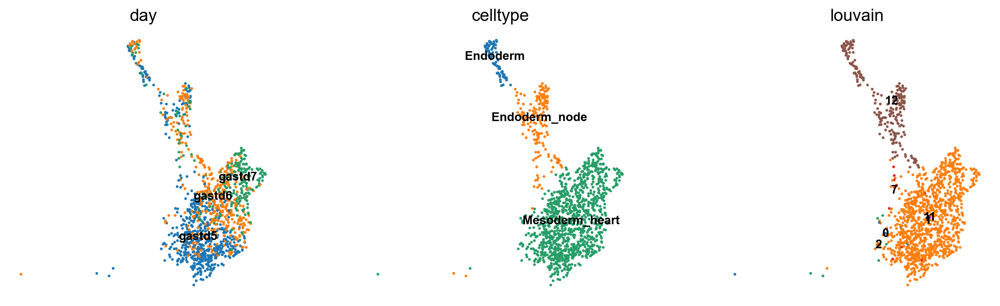

In [34]:
#fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata_sub, frameon = False, color=['day', 'celltype', 'louvain'],size=20, legend_loc = 'on data', legend_fontsize=10)#, legend_fontweight='light')

We can calculate the top differentially expressed genes from the beginning to the end of the umap or vice versa (or between any of the clusters we'd like)

In [76]:
sc.tl.rank_genes_groups(adata_sub, 'celltype', groups=['Endoderm'], reference='Endoderm_node', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


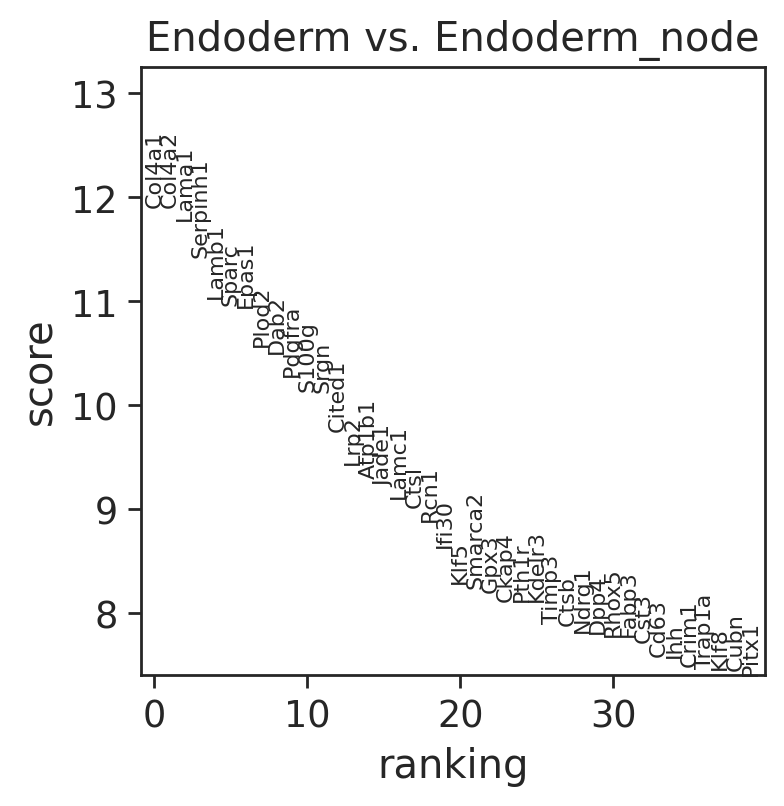

In [79]:
sc.pl.rank_genes_groups(adata_sub, groups=['Endoderm'], n_genes=40)

In [82]:
result = adata_sub.uns['rank_genes_groups']
groups = result['names'].dtype.names
listOfDiffGenes = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'scores']}).sort_values(by = 'Endoderm_s' ,ascending = False)

listOfDiffGenes.head(20)

,Endoderm_n,Endoderm_p,Endoderm_s
0,Col4a1,1.682144e-28,11.906019
1,Col4a2,1.682144e-28,11.902226
2,Lama1,4.557323e-28,11.784664
3,Serpinh1,2.255648e-26,11.426290
4,Lamb1,1.565949e-24,11.031887
5,Sparc,2.900600e-24,10.959832
6,Epas1,3.097406e-24,10.939923
7,Plod2,1.450698e-22,10.573015
8,Dab2,2.801796e-22,10.500012
9,Pdgfra,2.505816e-21,10.281006


In [38]:
#listOfDiffGenes['NeuralTube_Somites_n'].head(10)

In [39]:
#genes = pd.DataFrame(adata_sub.uns['rank_genes_groups']['names']['NeuralTube_Somites'])[0].head(10)
#sc.pl.umap(adata_sub, color=listOfDiffGenes['NeuralTube_Somites_n'][1000:1010], color_map = 'viridis', use_raw=True)

In [40]:
#listOfDiffGenes.to_csv(pathToData + '20210223_listOfDifferentialGenes_neuronTrajectory.csv', sep = '\t')

# Trajectory inference

If the data is subsetted, neighbors need to be recalculated. Otherwise: skip this step.

In [41]:
sc.pp.neighbors(adata_sub, n_neighbors=4, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


This gives a more detailed output

In [42]:
adata_sub.X = adata_sub.X.astype('float64')

Pre-processing and normalization was already done. We can move straight on to drawing the graph.

In [43]:
sc.tl.draw_graph(adata_sub)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:04)


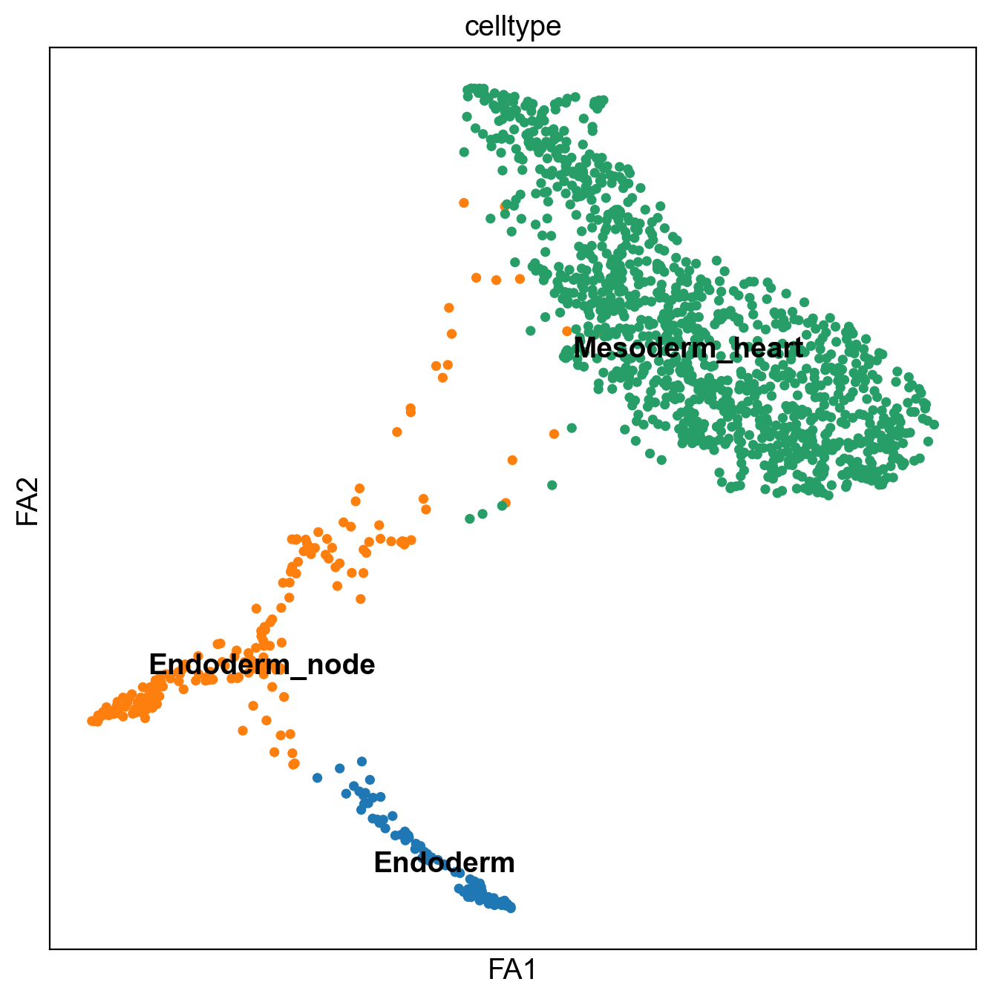

In [44]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.draw_graph(adata_sub, color='celltype', ax=ax,legend_loc='on data')

This looks pretty messy.

#### Optional: Denoising the graph

To denoise the graph, we represent it in diffusion map space (and not in PCA space). Computing distances within a few diffusion components amounts to denoising the graph - we just take a few of the first spectral components. It’s very similar to denoising a data matrix using PCA. The approach has been used in a couple of papers, see e.g. Schiebinger et al. (2017) or Tabaka et al. (2018). It’s also related to the principles behind MAGIC Dijk et al. (2018).

This is not a necessary step, neither for PAGA, nor clustering, nor pseudotime estimation. You might just as well go ahead with a non-denoised graph. In many situations (also here), this will give you very decent results.

In [45]:
sc.tl.diffmap(adata_sub)
sc.pp.neighbors(adata_sub, n_neighbors=10, use_rep='X_diffmap')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9983806  0.99468315 0.98857373 0.9857989  0.97799116
     0.97037494 0.96988004 0.96637183 0.9634075  0.95467496 0.94749546
     0.946177   0.9423754  0.940127  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [46]:
sc.tl.draw_graph(adata_sub)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:04)


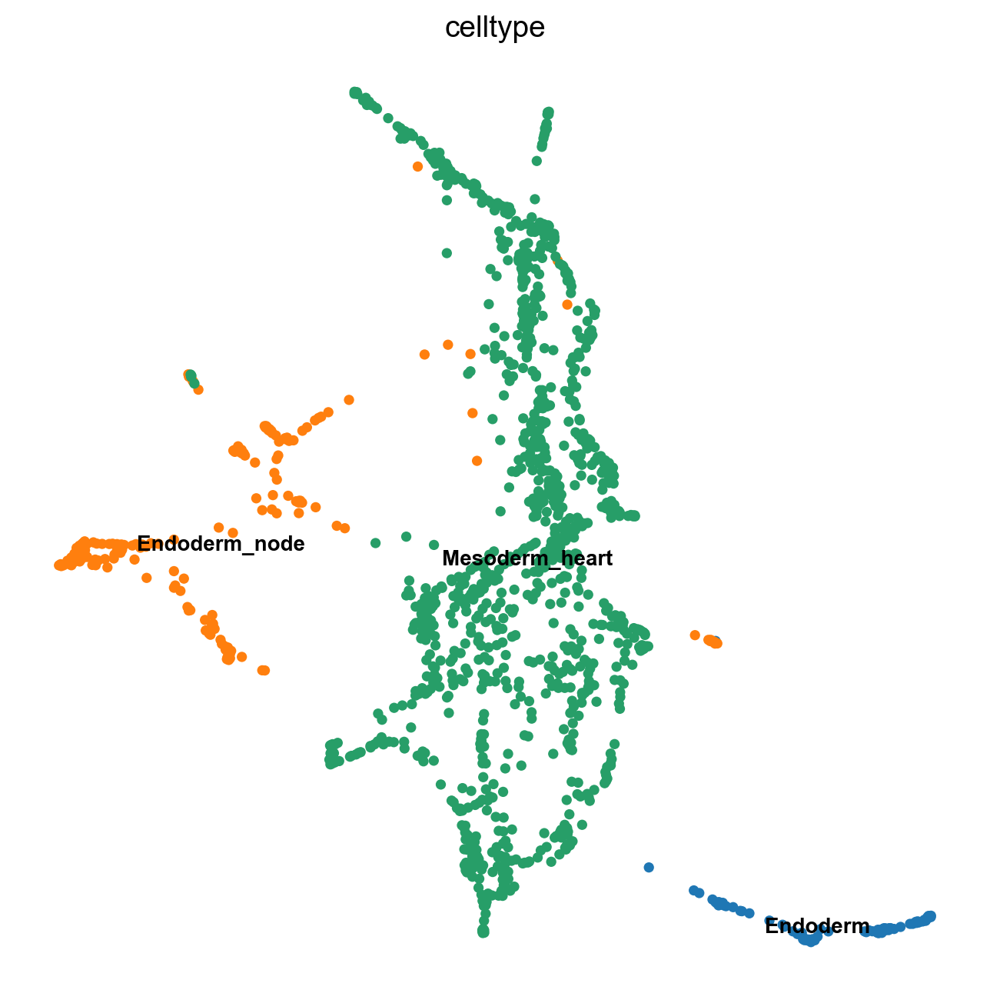

In [47]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.draw_graph(adata_sub, color='celltype', ax=ax, legend_loc='on data', frameon = False, legend_fontsize = 10)

This still looks messy, but in a different way: a lot of the branches are overplotted.

For simple, coarse-grained visualization, compute the PAGA graph, a coarse-grained and simplified (abstracted) graph. Non-significant edges in the coarse- grained graph are thresholded away.

In [48]:
sc.tl.paga(adata_sub, groups='celltype')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


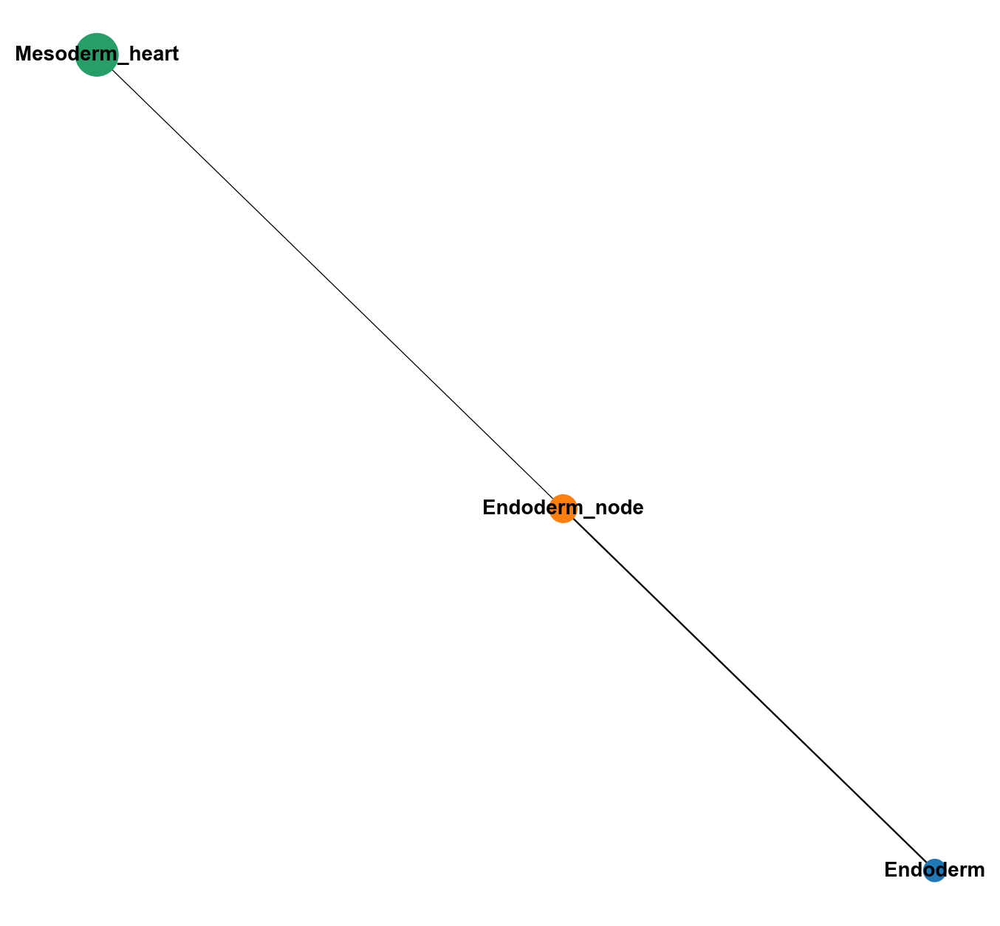

In [49]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.paga(adata_sub, color='celltype', ax=ax, threshold = 0.03, frameon=False, fontsize = 10)

We can also plot expression of (marker) genes on this graph.

--> added 'pos', the PAGA positions (adata.uns['paga'])


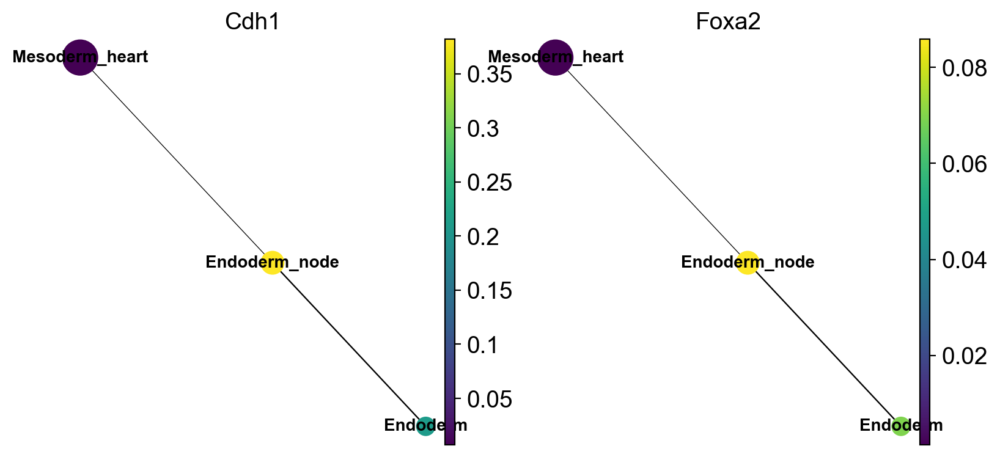

In [55]:
sc.pl.paga(adata_sub, color=['Cdh1', 'Foxa2'], threshold = 0.03, frameon=False, fontsize = 10)

Now, let's re-compute the embedding so we can see all marker genes also at single-cell resolution.

In [56]:
sc.tl.draw_graph(adata_sub, init_pos='paga')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:04)


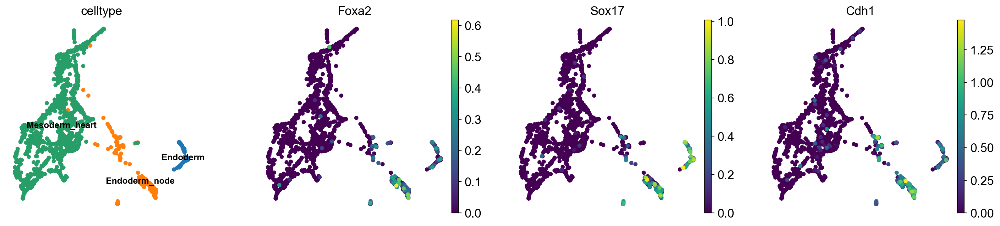

In [57]:
sc.pl.draw_graph(adata_sub, color=['celltype', 'Foxa2', 'Sox17', 'Cdh1'], legend_fontsize  = 10, frameon = False, legend_loc='on data')

#### Reconstructing gene changes along PAGA paths for a given set of genes

Choose a root node for diffusion pseudotime.

In [58]:
adata_sub.uns['iroot'] = np.flatnonzero(adata_sub.obs['celltype']  == 'Mesoderm_heart')[0]

In [59]:
sc.tl.dpt(adata_sub)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


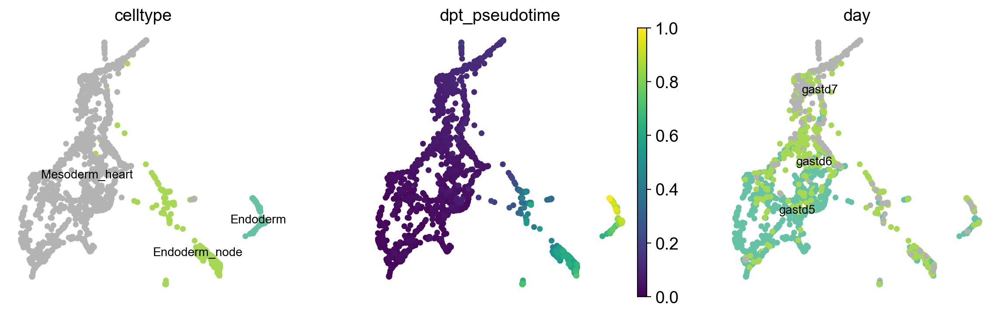

In [60]:
sc.pl.draw_graph(adata_sub, color=['celltype', 'dpt_pseudotime','day'], legend_loc='on data',palette='Set2', frameon = False, legend_fontweight='light',legend_fontsize = 10)

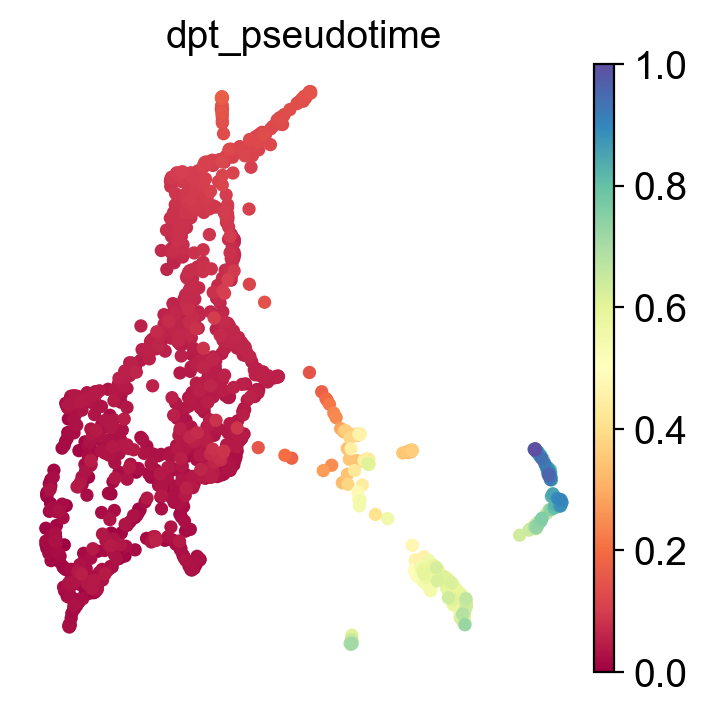

In [61]:
sc.pl.draw_graph(adata_sub, color='dpt_pseudotime', legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

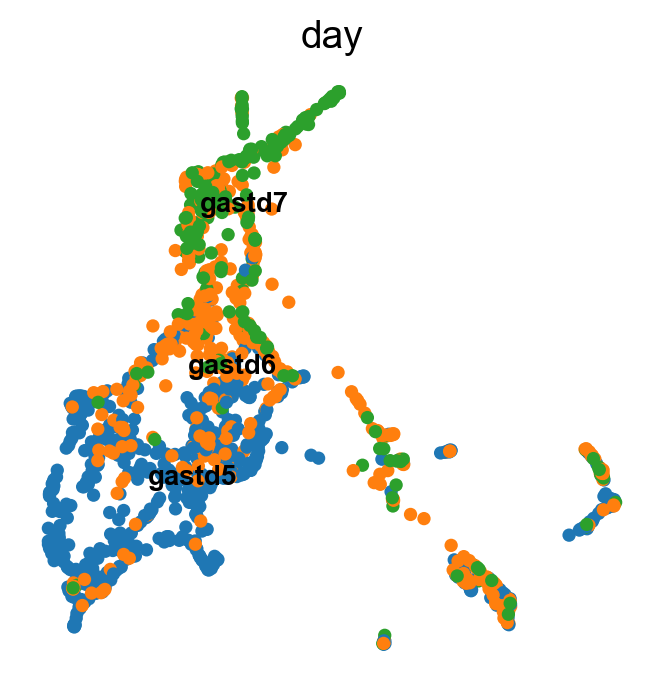

In [62]:
sc.pl.draw_graph(adata_sub, color=['day'],legend_loc='on data',palette=['tab:blue', 'tab:orange','tab:green'], frameon = False, legend_fontsize = 10)

--> added 'pos', the PAGA positions (adata.uns['paga'])


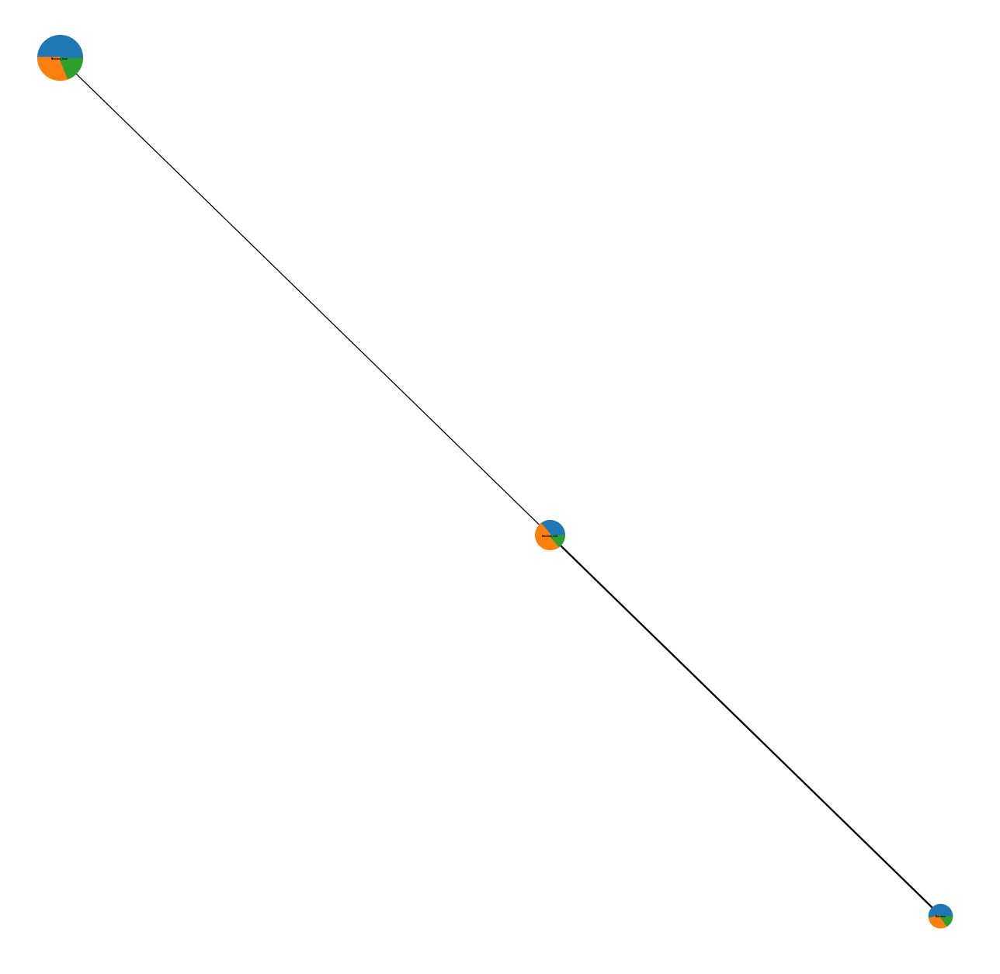

In [63]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.paga(adata_sub, color='day', threshold = 0.03,ax=ax, frameon=False, fontsize = 1)

--> added 'pos', the PAGA positions (adata.uns['paga'])


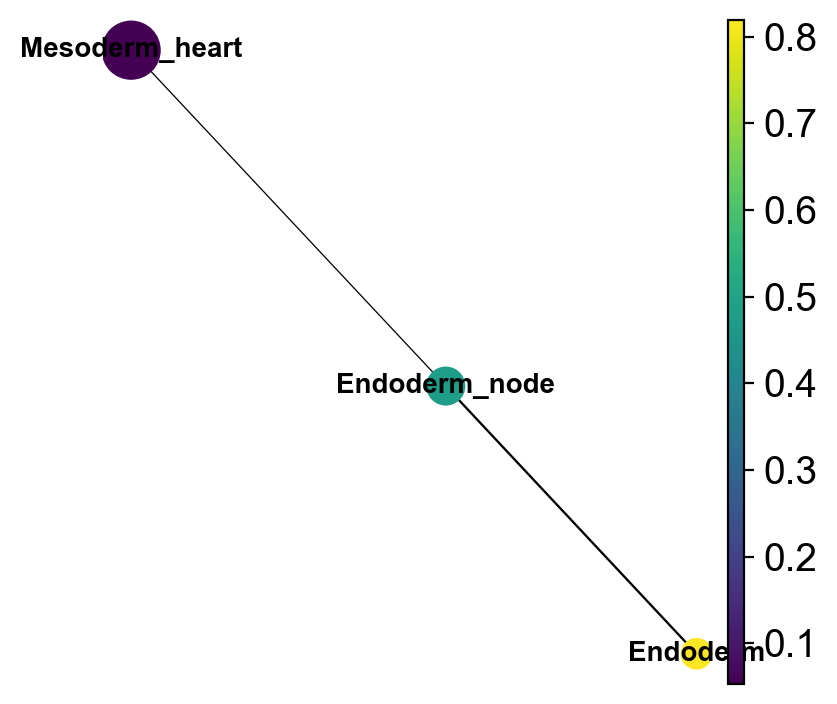

In [64]:
#fig, ax = plt.subplots(figsize=(8,8))
sc.pl.paga(adata_sub, color='dpt_pseudotime',threshold = 0.03,  frameon = False,fontsize = 10)

# Use wishbone

Rerun the computation of the tsne and diffmap if you have subsetted the data.

In [65]:
#sc.tl.tsne(adata=adata_sub, n_pcs=5, perplexity=30)
#sc.tl.diffmap(adata_sub, n_comps=10)

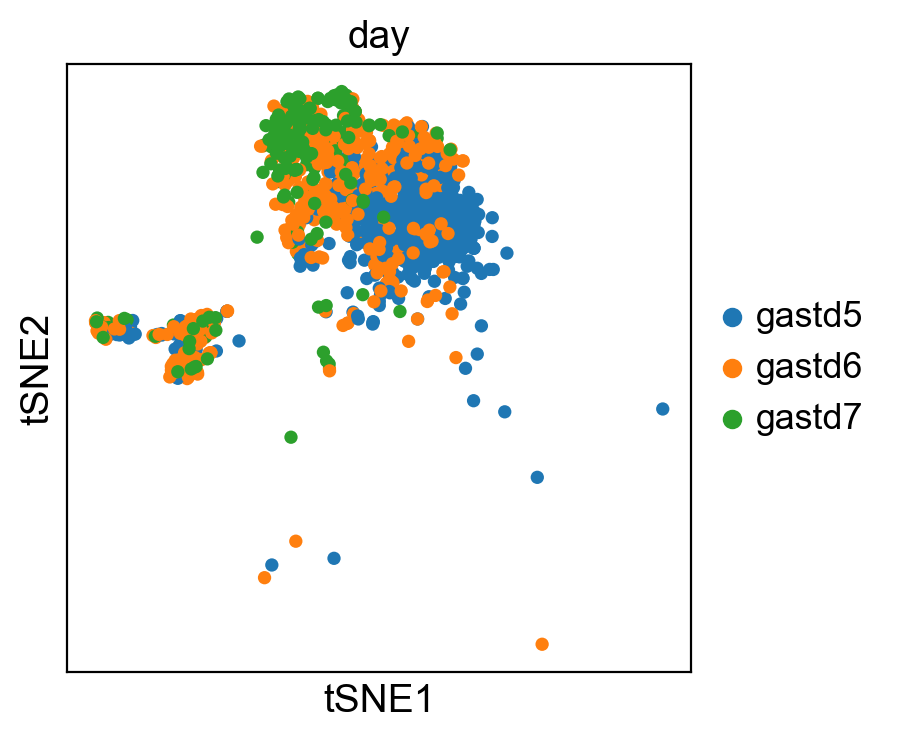

In [66]:
sc.pl.tsne(adata_sub, color = 'day')

We can use the pseudotime calculated by PAGA to pick our root cell for wishbone. Just pick the cell with the lowest pseudotime

In [67]:
adata_sub.obs.sort_values(by=['dpt_pseudotime'])

,n_counts,n_genes,percent_mito,batch,day,replicates,mark,umap_density_mark,leiden,louvain,celltype,dpt_pseudotime
PZ-MB-gastd5-TCHIC-rep1-H3K27ac-1:ACGTACTG-2,2270.0,1576,0.217600,2,gastd5,rep1,H3K27ac,0.526835,1,1,Mesoderm_heart,0.000000
PZ-MB-gastd5-TChIC-rep1-H3K4me3-2:GGATGATG-2,5863.0,2936,0.013653,2,gastd5,rep1,H3K4me3,0.188973,1,1,Mesoderm_heart,0.000588
PZ-MB-gastd5-TChIC-rep1-H3K4me3-2:CGGAAGTG-2,5035.0,2752,0.103969,2,gastd5,rep1,H3K4me3,0.310696,1,1,Mesoderm_heart,0.002572
PZ-MB-gastd5-TChIC-rep1-H3K27me3-4:CCTGCTAT-2,6167.0,3103,0.129749,2,gastd5,rep1,H3K27me3,0.164192,1,1,Mesoderm_heart,0.003295
PZ-MB-gastd5-TChIC-rep1-H3K27me3-2:ACAGGCAT-2,5436.0,2902,0.123433,2,gastd5,rep1,H3K27me3,0.229778,1,1,Mesoderm_heart,0.004707
...,...,...,...,...,...,...,...,...,...,...,...,...
PZ-MB-gastd5-TCHIC-rep1-H3K27ac-1:GGTGACTA-0,9899.0,4168,0.190751,0,gastd5,rep1,H3K27ac,0.015848,17,12,Endoderm,0.945773
PZ-MB-gastd7-TChIC-rep1-H3K27me3-2:TACTGCTG-0,2840.0,2061,0.059237,0,gastd7,rep1,H3K27me3,0.019464,17,12,Endoderm,0.959842
PZ-MB-gastd6-TChIC-rep1-H3K27me3-3:GTTGGTGA-0,4316.0,2286,0.141062,0,gastd6,rep1,H3K27me3,0.002189,17,12,Endoderm,0.965216
PZ-MB-gastd6-TChIC-rep1-H3K27me3-2:AGTGCAGA-0,6029.0,3148,0.132649,0,gastd6,rep1,H3K27me3,0.007831,17,12,Endoderm,0.990670


Actually run wishbone

In [68]:
sce.tl.wishbone(adata=adata_sub, start_cell='PZ-MB-gastd5-TCHIC-rep1-H3K27ac-1:ACGTACTG-2',
                components=[1,2,3], num_waypoints=150)

Building lNN graph...
lNN computed in : 0.02 seconds
Determining waypoints if not specified...
Determining shortest path distances and perspectives....
......................................................................................................................................................
Time for determining distances and perspectives: 17.17 seconds
Determining branch point and branch associations...
Running iterations...
Iteration: 2
Correlation with previous iteration:  0.9996
1 realignment iterations


Now we can see how well wishbone did with calculating pseudotime and determining branches.

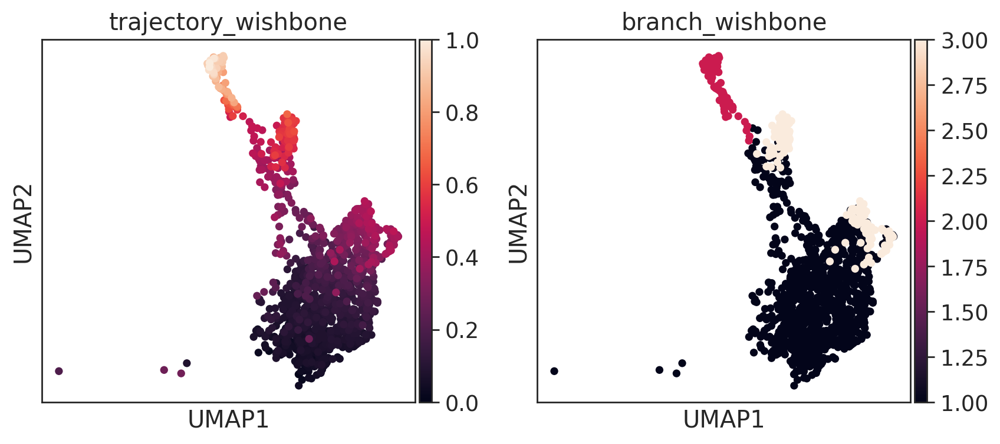

In [69]:
sc.pl.umap(adata_sub, color=['trajectory_wishbone', 'branch_wishbone'])


Some other plots

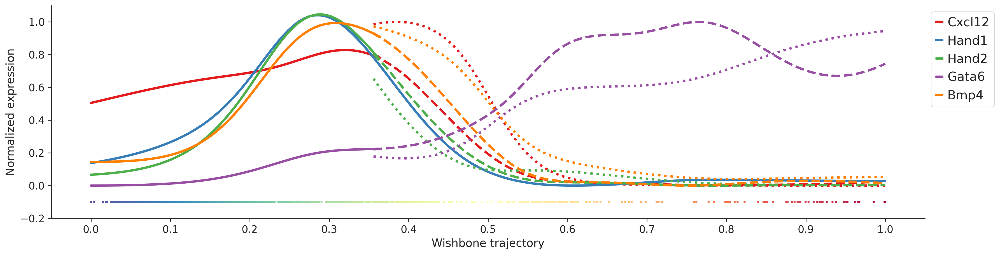

In [70]:
markers = ['Cxcl12','Hand1','Hand2', 'Gata6', 'Bmp4']
fig, ax = plt.subplots(figsize=(20,5))
sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show_variance=False)

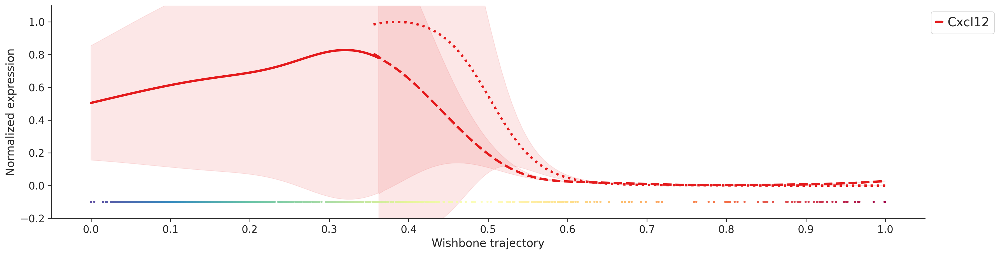

In [71]:
markers = ['Cxcl12']#, 'T', 'Cdx2']
fig, ax = plt.subplots(figsize=(20,5))
sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show_variance=True)

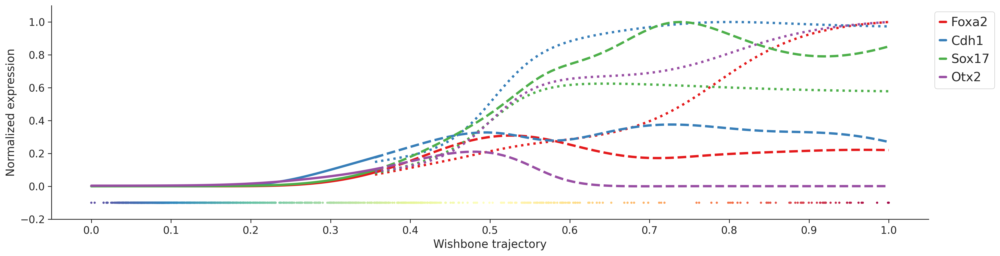

In [83]:
markers = ['Foxa2', 'Cdh1', 'Sox17', 'Otx2']
fig, ax = plt.subplots(figsize=(20,5))
sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show_variance=False)

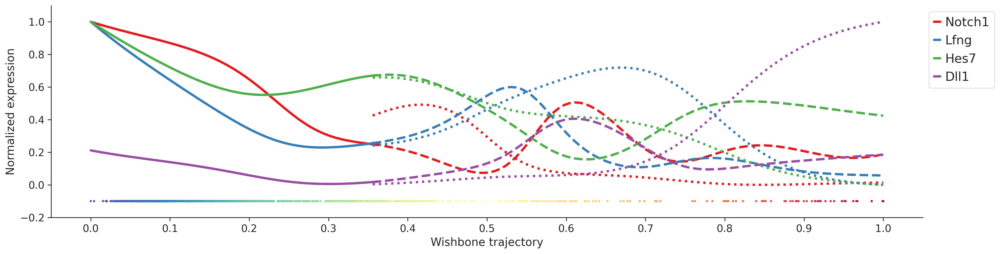

In [84]:
markers = ['Notch1', 'Lfng','Hes7','Dll1']
fig, ax = plt.subplots(figsize=(20,5))
sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show=True)

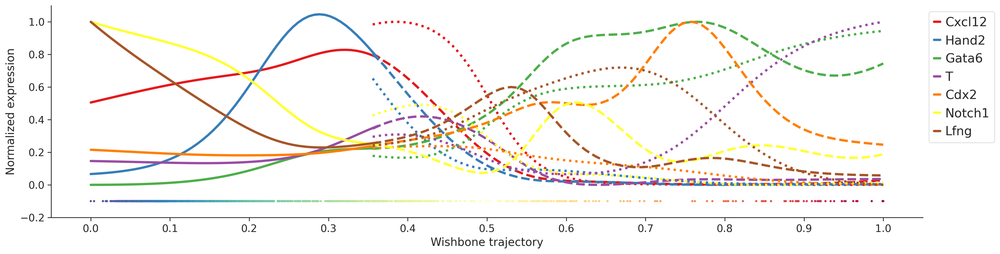

In [85]:
markers = ['Cxcl12','Hand2', 'Gata6', 'T','Cdx2','Notch1','Lfng']
fig, ax = plt.subplots(figsize=(20,5))
sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show=True)

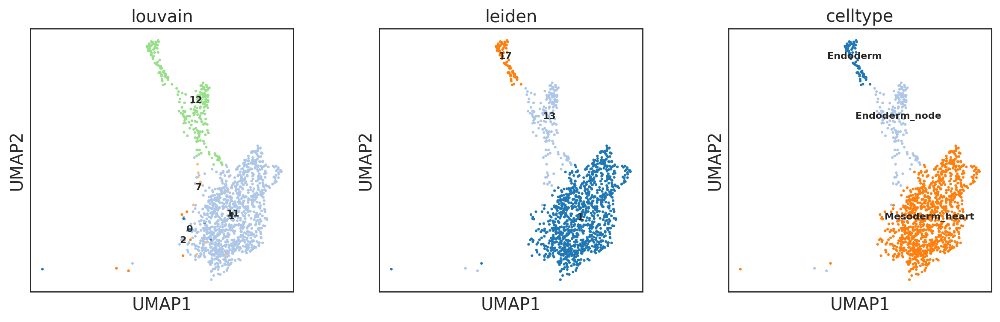

In [86]:
sc.pl.umap(adata_sub, color=['louvain','leiden', 'celltype'], palette=sns.color_palette("tab20", 17), legend_loc = "on data", legend_fontsize=8,  size=20)

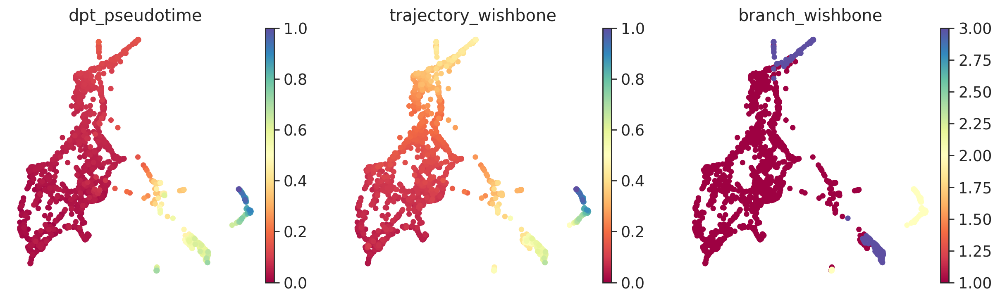

In [87]:
sc.pl.draw_graph(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'branch_wishbone'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

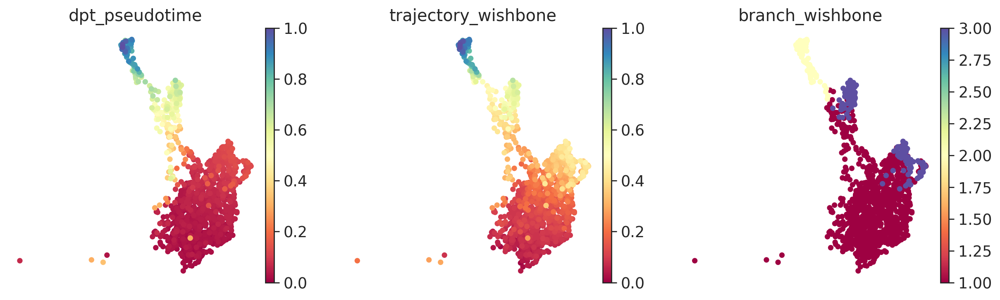

In [88]:
sc.pl.umap(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'branch_wishbone'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

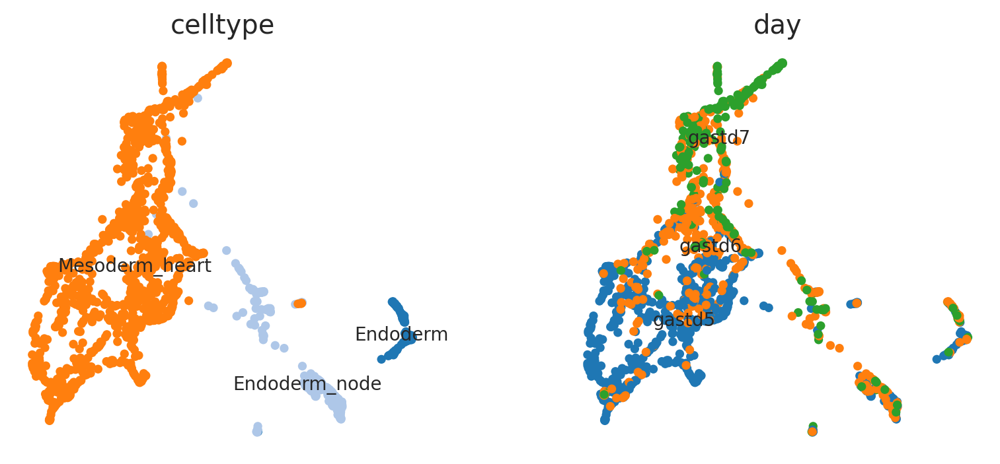

In [89]:
sc.pl.draw_graph(adata_sub, color=['celltype', 'day'],legend_loc='on data', frameon = False, legend_fontsize = 10, legend_fontweight='normal')

# Computing RNA velocity

filter and normalise

In [90]:
#scv.pp.filter_genes(adata_sub, min_shared_counts=10)
#scv.pp.normalize_per_cell(adata_sub)
#scv.pp.filter_genes_dispersion(adata_sub, n_top_genes=8000)
#scv.pp.log1p(adata_sub)

In [91]:
#scv.pp.filter_and_normalize(adata_sub, min_shared_counts=10, n_top_genes=5000)
#scv.pp.moments(adata_sub, n_pcs=30, n_neighbors=30)

actually calculate velocity

In [92]:
scv.tl.velocity(adata_sub)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [93]:
scv.tl.velocity_graph(adata_sub)

computing velocity graph
    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Project velocities

We can choose different ways of visualising the velocity onto the umap

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


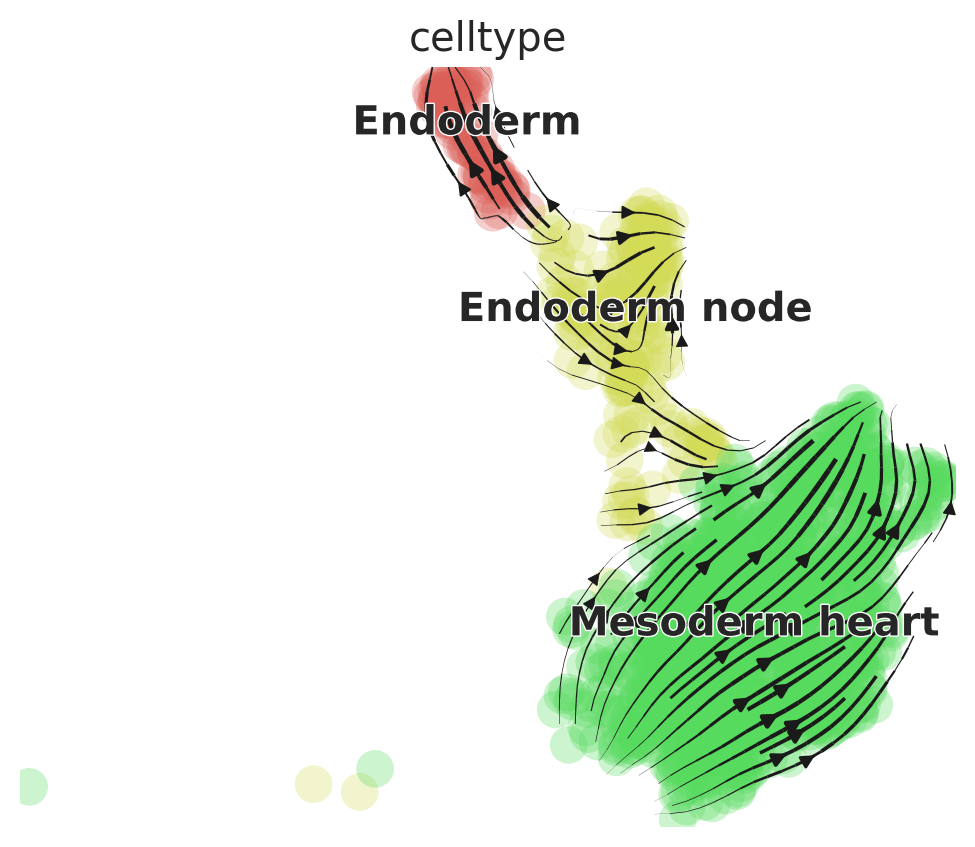

In [94]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, ax=ax, basis='umap', color = 'celltype', palette=sns.color_palette("hls", 6))

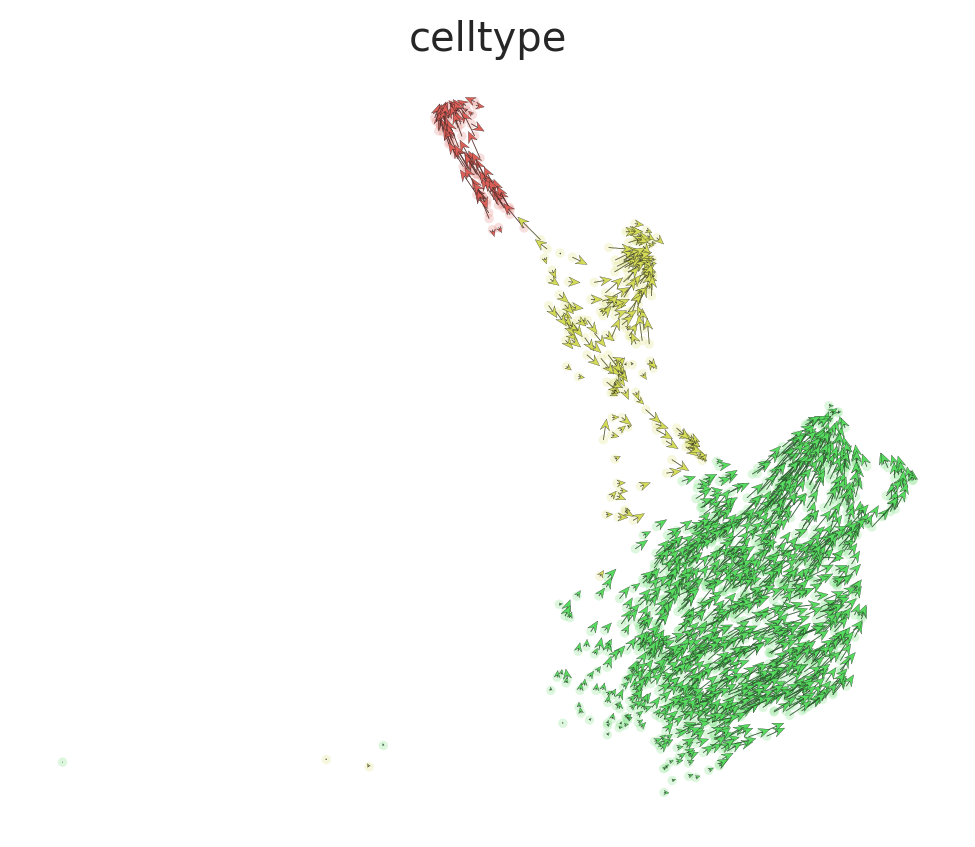

In [95]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding(adata_sub, ax=ax, arrow_length=3, arrow_size=2, dpi=120, color = 'celltype', palette=sns.color_palette("hls", 6))

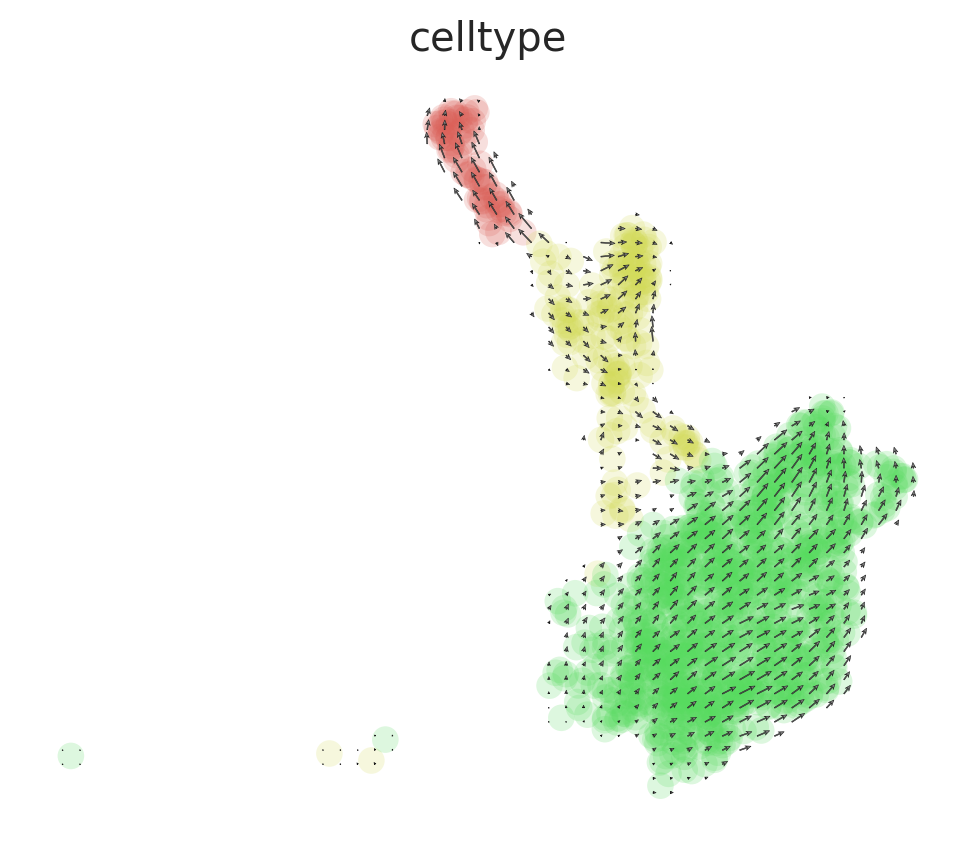

In [96]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_grid(adata_sub, ax=ax, basis='umap', color = 'celltype', palette=sns.color_palette("hls", 6))

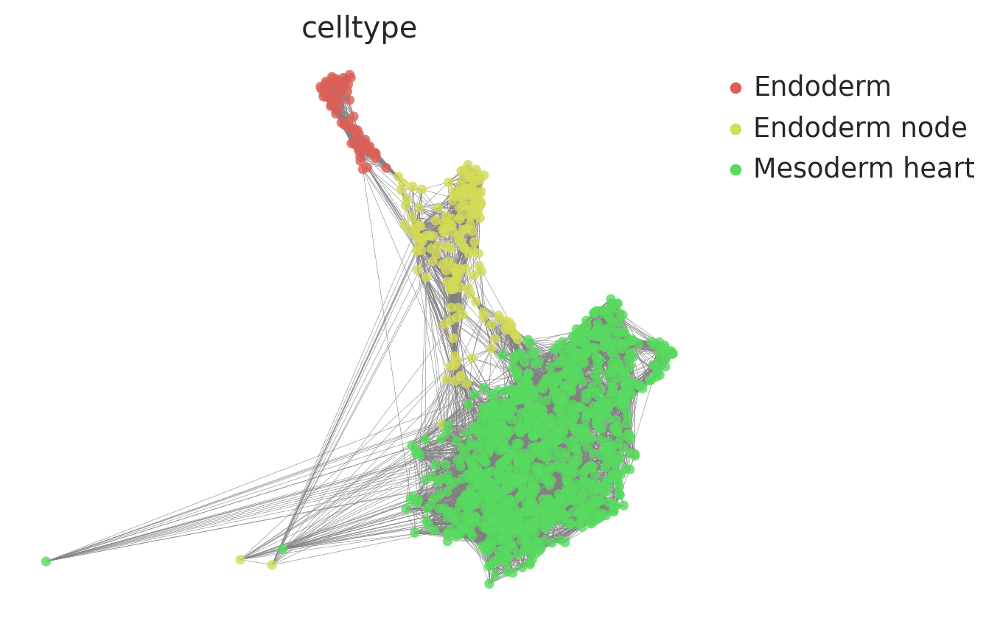

In [97]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_graph(adata_sub, ax=ax, color = 'celltype', palette=sns.color_palette("hls", 6))

The cell cycle detected by RNA velocity, is biologically affirmed by cell cycle scores (standardized scores of mean expression levels of phase marker genes).

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    377 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    334 total control genes are used. (0:00:00)
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


ZeroDivisionError: division by zero

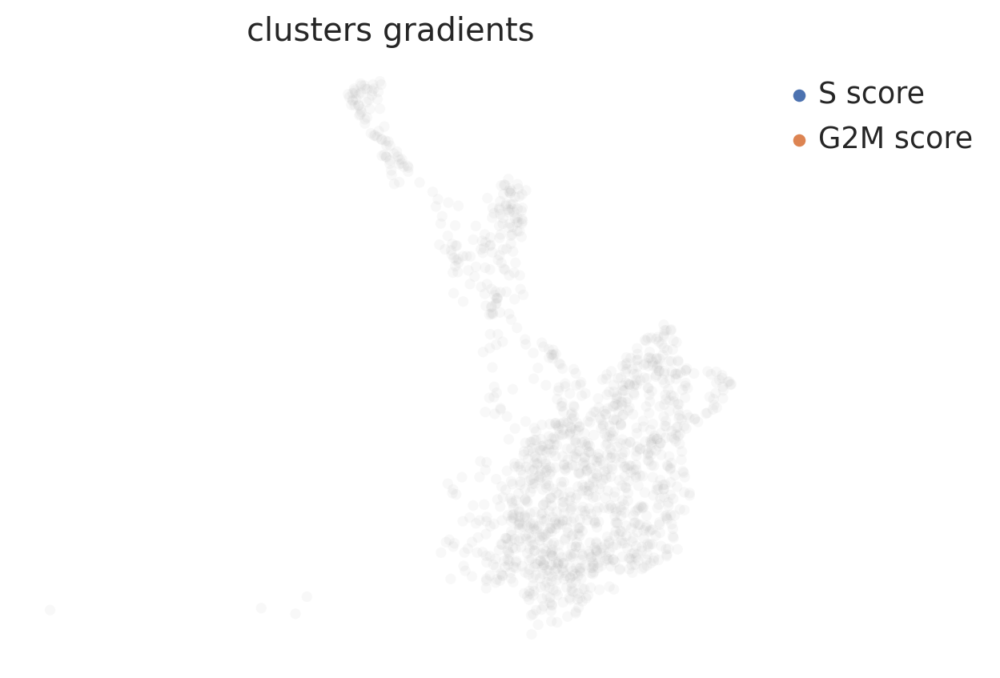

In [98]:
scv.tl.score_genes_cell_cycle(adata_sub)
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.scatter(adata_sub, ax=ax,color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

Two more useful stats: - The speed or rate of differentiation is given by the length of the velocity vector. - The coherence of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


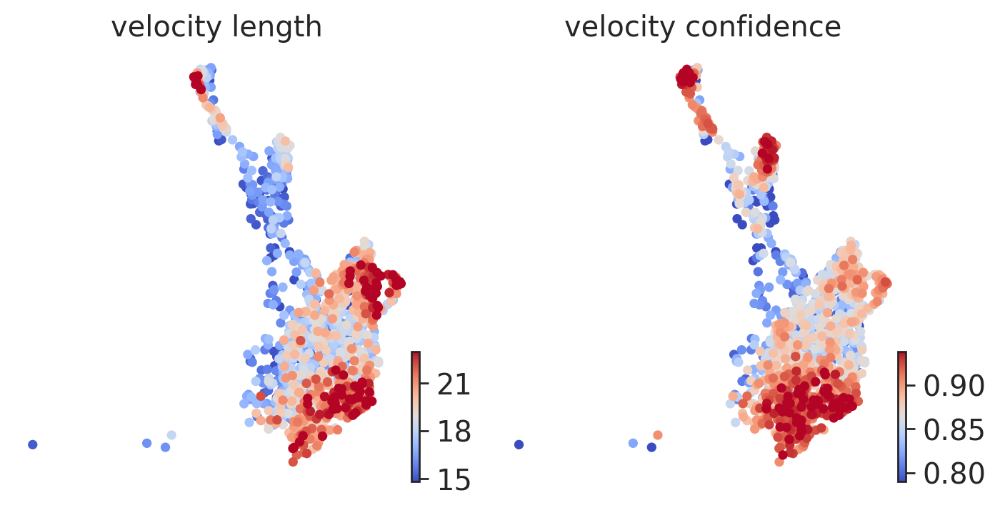

In [99]:
scv.tl.velocity_confidence(adata_sub)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_sub, c=keys, cmap='coolwarm', perc=[5, 95])

We can also calculate and plot the velocity pseudotime

computing terminal states
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


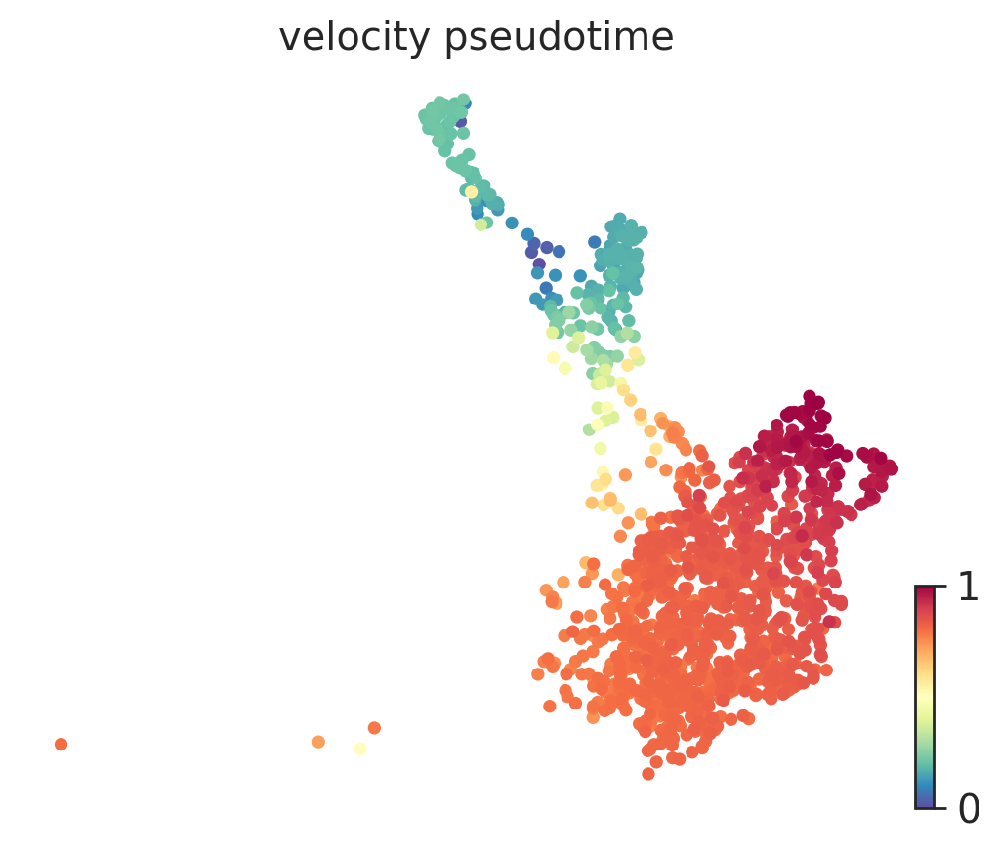

In [100]:
scv.tl.velocity_pseudotime(adata_sub)
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.scatter(adata_sub, ax=ax, color='velocity_pseudotime', cmap='Spectral_r')

To see the different batches on top of the 'velocity' umap, just change the 'color'.

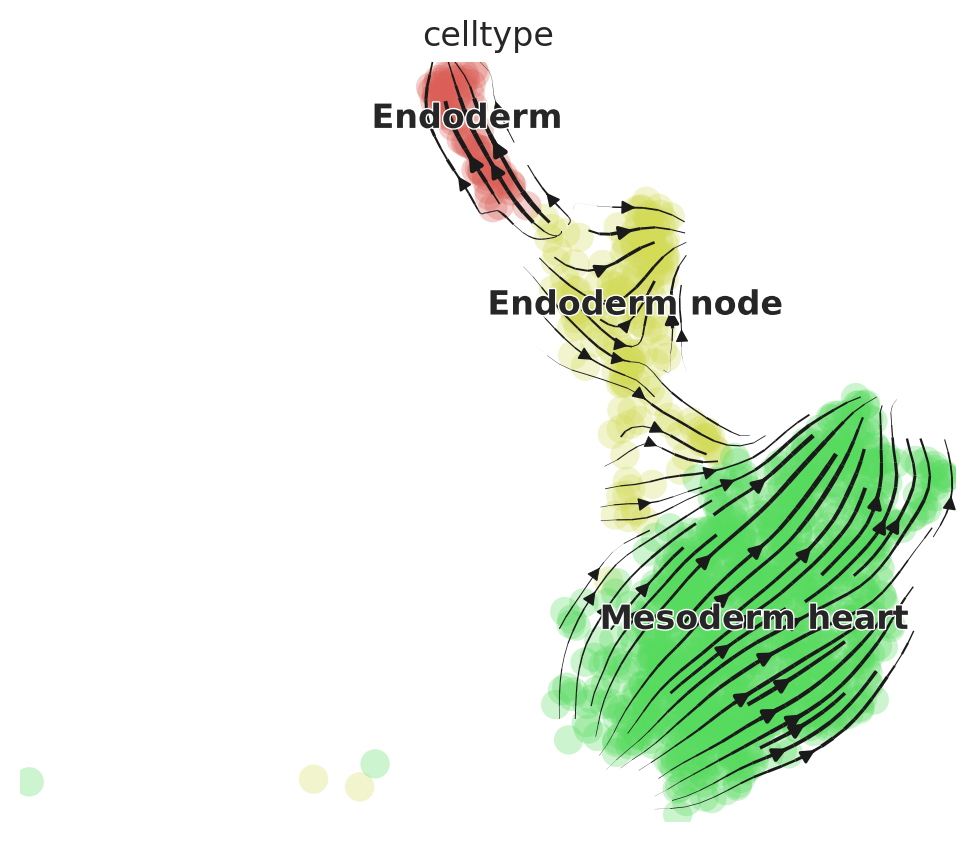

In [101]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, ax=ax,
                                 basis='umap', 
                                 color=['celltype'],palette=sns.color_palette("hls", 6))

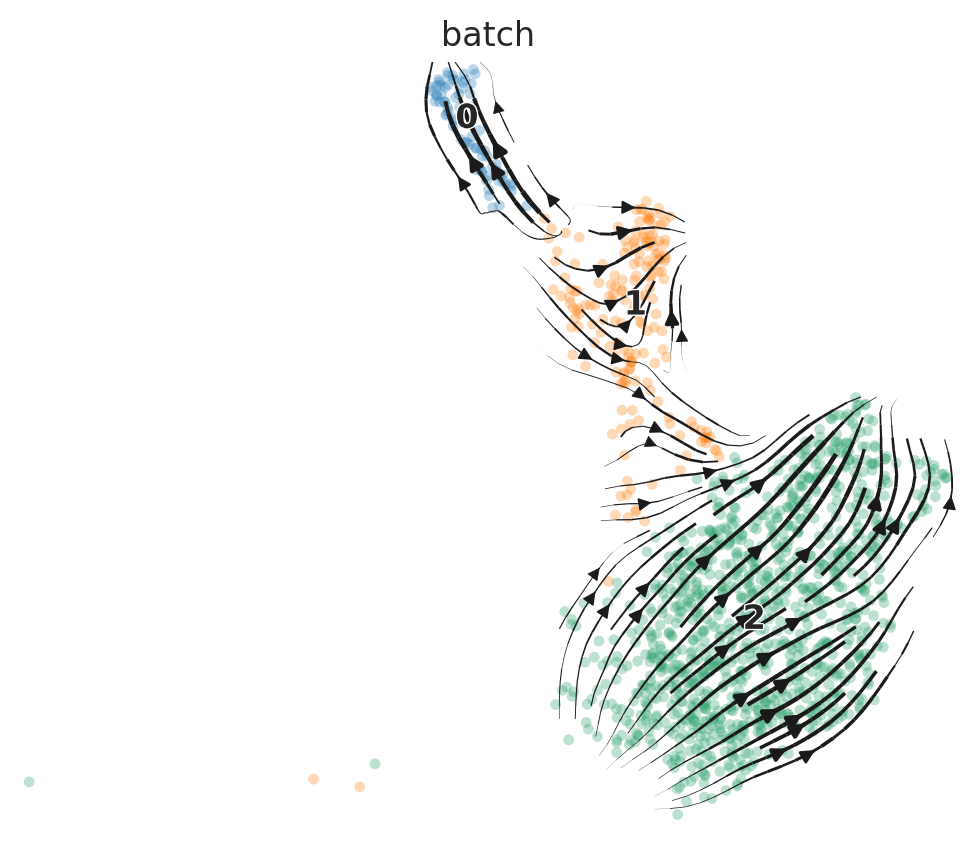

In [102]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, ax=ax,
                                 basis='umap', 
                                 color='batch',palette=sc.pl.palettes.default_20, size = 60)

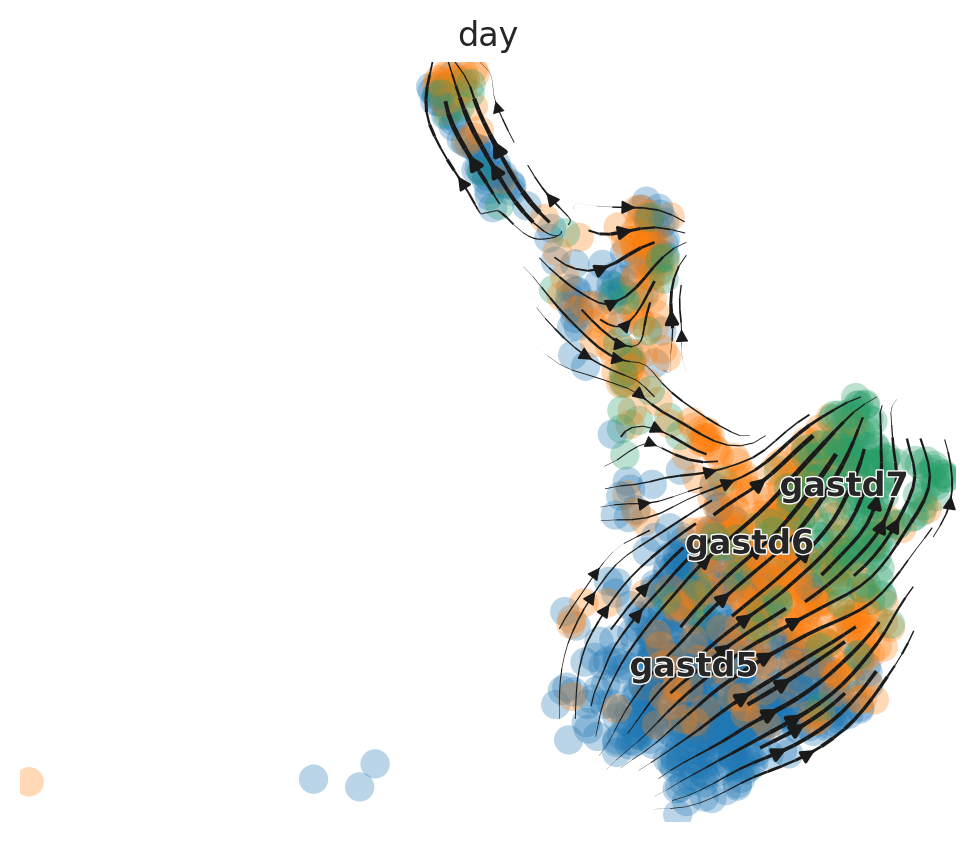

In [103]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, 
                                 basis='umap', ax=ax,
                                 color='day',palette=sc.pl.palettes.default_20)

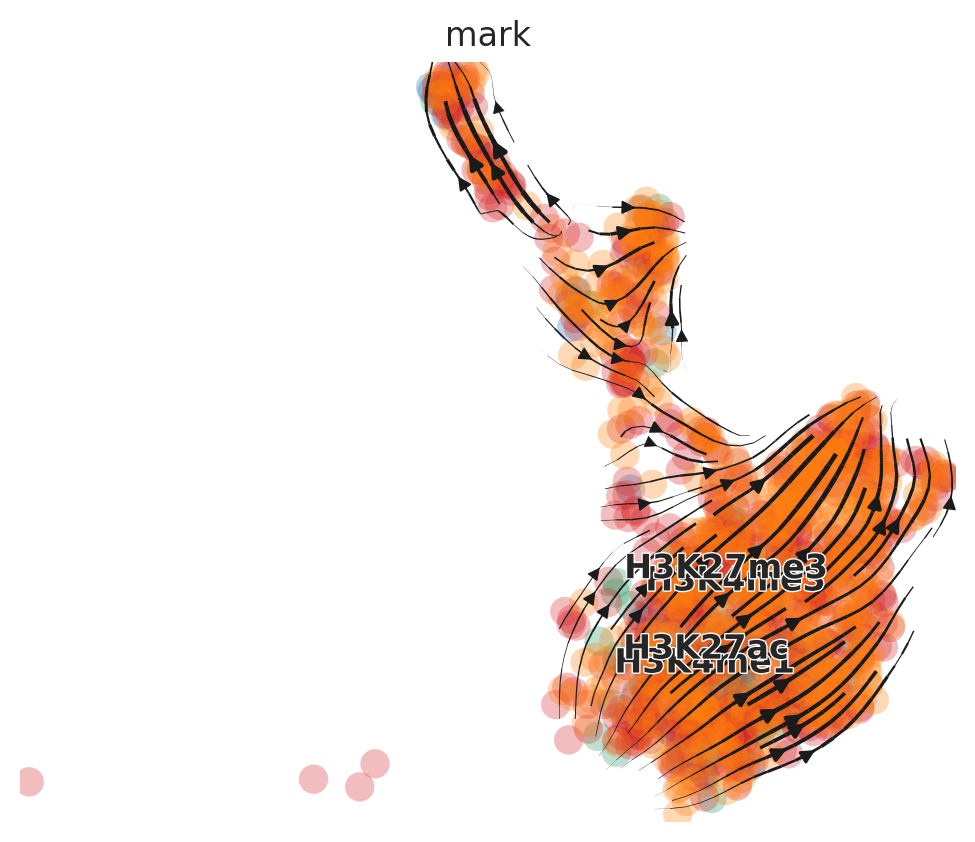

In [104]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, 
                                 basis='umap', ax=ax,
                                 color='mark',palette=sc.pl.palettes.default_20)

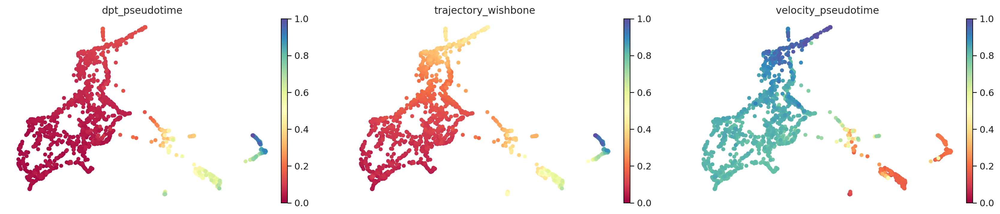

In [105]:
sc.pl.draw_graph(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'velocity_pseudotime'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

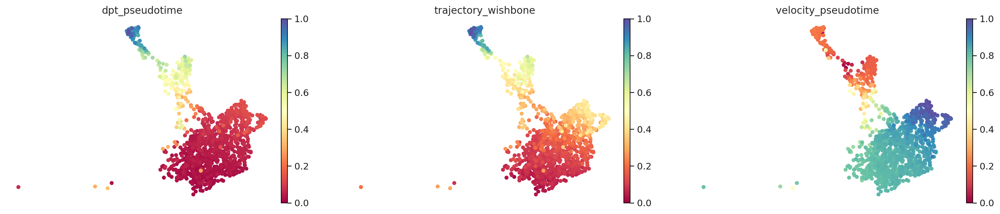

In [106]:
sc.pl.umap(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'velocity_pseudotime'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

Plotting our favourite genes in terms of velocity:

In [ ]:
sc.pl.umap(adata_sub, color = "Foxb1", color_map = "viridis", use_raw=True)

In [ ]:
scv.pl.velocity(adata_sub, var_names='Foxb1', color = "celltype", 
                palette=sns.color_palette('tab20',13), ncols=1) + sc.pl.umap(adata_sub, color='celltype', palette=sns.color_palette('tab20',13), 
                                                                             legend_loc = "on data", title='Cell types', legend_fontsize=10, frameon=False, size = 40)

In [ ]:
scv.pl.velocity(adata_sub, var_names=markergenes, color = "celltype", ncols=1)

To define the top velocity genes, we need to rank them per cluster.

In [ ]:
scv.tl.rank_velocity_genes(adata_sub, groupby = 'celltype', min_counts = 1, resolution=0.4)

pd.DataFrame(adata_sub.uns['rank_velocity_genes']['names']).head(10)

We can then visualise these too.

In [ ]:
scv.pl.velocity(adata_sub, var_names=pd.DataFrame(adata_sub.uns['rank_velocity_genes']['names']).head(5).values.flatten(), ncols=1, colorbar=True)

In [ ]:
#sc.pl.umap(adata_sub, color=['initial_size_spliced','initial_size_unspliced','velocity_self_transition'], color_map = 'viridis')

# save

During the course of this analysis, the AnnData accumlated the following annotations.

In [108]:
adata_sub

AnnData object with n_obs × n_vars = 1309 × 29196
    obs: 'n_counts', 'n_genes', 'percent_mito', 'batch', 'day', 'replicates', 'mark', 'umap_density_mark', 'leiden', 'louvain', 'celltype', 'dpt_pseudotime', 'trajectory_wishbone', 'branch_wishbone', 'velocity_self_transition', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'mean', 'std', 'dispersions-0', 'dispersions_norm-0', 'dispersions-1', 'dispersions_norm-1', 'dispersions-2', 'dispersions_norm-2', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'day_colors', 'celltype_colors', 'louvain_colors', 'neighbors', 'draw_graph', 'diffmap_evals', 'paga', 'celltype_sizes', 'iroot', 'trunk_wishbone', 'branch1_wishbone', 'branch2_wishbone', 'rank_genes_groups', 'leiden_colors', 'velocity_params', 'vel

In [109]:
results_file = pathToData + 'dataframes/20210223_TCHIC_rep1_trajectories_endo.h5ad' 
adata_sub.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations.

In [ ]:
#adata.X = None
#adata.write('./write/Scanpy120hAA.h5ad', compression='gzip')

If you want to export to "csv", you have the following options:

In [ ]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )